In [1]:
import os

folder = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"

print("Files in folder:")
for f in os.listdir(folder):
    print(f)


Files in folder:
ascatb_20250615_v02.1
ascatb_20250615_v02.1.auto.nc
ascatb_20250615_v02.1.decoded.nc
ascatb_20250615_v02.1.decoded_rss.nc
ascatb_20250615_v02.1_3day
ascatb_20250711_v02.1
ascatb_20250711_v02.1_3day
ascatb_20250717_v02.1
ascatb_20250720_v02.1
ascatb_20250720_v02.1_3day
ascatc_20250615_v02.1
ascatc_20250615_v02.1_3day
ascatc_20250711_v02.1
ascatc_20250711_v02.1_3day
ascatc_20250720_v02.1
ascatc_20250720_v02.1_3day
conversion_inventory.csv


In [2]:
import os
import numpy as np
import xarray as xr

# Folder containing your ASCAT files
folder = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"

# RSS ASCAT grid dimensions (global 0.25° grid, 1440 x 720)
NX, NY = 1440, 720
lon = np.linspace(0.125, 359.875, NX)   # center of bins
lat = np.linspace(-89.875, 89.875, NY)  # center of bins

for fname in os.listdir(folder):
    if not fname.endswith("_3day"):
        continue  # only process gridded files

    fpath = os.path.join(folder, fname)
    print(f"Processing {fname}...")

    # Read binary float32 grid (big-endian)
    raw = np.fromfile(fpath, dtype=">f4")
    if raw.size != NX * NY:
        print(f"⚠️ Size mismatch in {fname}, skipping")
        continue

    grid = raw.reshape(NY, NX)

    # Wrap in xarray Dataset
    ds = xr.Dataset(
        {"windspeed": (("lat", "lon"), grid)},
        coords={"lat": lat, "lon": lon}
    )

    # Save to NetCDF
    nc_out = fpath + ".nc"
    ds.to_netcdf(nc_out)
    print(f"✅ Saved {nc_out}")


Processing ascatb_20250615_v02.1_3day...
✅ Saved E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1_3day.nc
Processing ascatb_20250711_v02.1_3day...
✅ Saved E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250711_v02.1_3day.nc
Processing ascatb_20250720_v02.1_3day...
✅ Saved E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250720_v02.1_3day.nc
Processing ascatc_20250615_v02.1_3day...
✅ Saved E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250615_v02.1_3day.nc
Processing ascatc_20250711_v02.1_3day...
✅ Saved E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250711_v02.1_3day.nc
Processing ascatc_20250720_v02.1_3day...
✅ Saved E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250720_v02.1_3day.nc


In [42]:
import os
import sys
import hashlib
import numpy as np
import pandas as pd
import xarray as xr

# Optional parsers
try:
    from eccodes import (
        codes_bufr_new_from_file, codes_set, codes_release,
        codes_keys_iterator_new, codes_keys_iterator_next,
        codes_keys_iterator_get_name, codes_keys_iterator_delete,
        codes_get_array, codes_get, CodesInternalError,
        # GRIB (only if needed)
    )
    HAVE_ECCODES = True
except Exception:
    HAVE_ECCODES = False

try:
    import h5py
    HAVE_H5PY = True
except Exception:
    HAVE_H5PY = False

FOLDER = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"
OUT_DIR = FOLDER  # write .nc next to inputs

def md5sum(path, blocksize=1024 * 1024):
    h = hashlib.md5()
    with open(path, "rb") as f:
        while True:
            b = f.read(blocksize)
            if not b: break
            h.update(b)
    return h.hexdigest()

# ----------------- BUFR helpers (robust) -----------------
def list_data_keys(bid):
    it = codes_keys_iterator_new(bid, "data")
    keys = []
    try:
        while codes_keys_iterator_next(it):
            k = codes_keys_iterator_get_name(it)
            if isinstance(k, bytes):
                k = k.decode("utf-8", errors="ignore")
            keys.append(k)
    finally:
        codes_keys_iterator_delete(it)
    return keys

def safe_get(bid, key):
    try:
        vals = codes_get_array(bid, key)
        return np.array(vals).ravel()
    except CodesInternalError:
        try:
            val = codes_get(bid, key)
            if isinstance(val, (bytes, bytearray)):
                val = val.decode("utf-8", errors="ignore")
            return np.array([val])
        except Exception:
            return None

def pick_obs_len(keys, getter):
    for cand in ("latitude", "lat", "latitudeOfObservation"):
        if cand in keys:
            v = getter(cand)
            if v is not None and v.size > 0:
                return v.size
    for cand in ("longitude", "lon", "longitudeOfObservation"):
        if cand in keys:
            v = getter(cand)
            if v is not None and v.size > 0:
                return v.size
    return 0

def to_datetime64(year, month, day, hour=None, minute=None, second=None):
    n = len(year)
    hh = hour if hour is not None and len(hour) == n else np.zeros(n, dtype=int)
    mm = minute if minute is not None and len(minute) == n else np.zeros(n, dtype=int)
    ss = second if second is not None and len(second) == n else np.zeros(n, dtype=int)
    year  = np.clip(year.astype(int), 1900, 3000)
    month = np.clip(month.astype(int), 1, 12)
    day   = np.clip(day.astype(int),   1, 31)
    hh    = np.clip(hh.astype(int),    0, 23)
    mm    = np.clip(mm.astype(int),    0, 59)
    ss    = np.clip(ss.astype(int),    0, 59)
    iso = np.char.add(
        np.char.add(np.char.add(year.astype(str), "-"), np.char.zfill(month.astype(str), 2)),
        np.char.add("-", np.char.zfill(day.astype(str), 2))
    )
    hms = np.char.add(
        np.char.add(np.char.zfill(hh.astype(str), 2), ":"),
        np.char.add(np.char.zfill(mm.astype(str), 2), ":")
    )
    hms = np.char.add(hms, np.char.zfill(ss.astype(str), 2))
    stamps = np.char.add(np.char.add(iso, "T"), hms)
    out = np.array([np.datetime64(s) if len(s) == 19 else np.datetime64('NaT') for s in stamps])
    return out

def try_decode_bufr_to_xr(path):
    if not HAVE_ECCODES:
        return None, "eccodes_not_available"

    one_d = {}
    two_d = {}
    beam_sizes = {}
    total_obs = 0
    messages = 0

    try:
        with open(path, "rb") as fh:
            while True:
                bid = None
                try:
                    bid = codes_bufr_new_from_file(fh)
                    if bid is None:
                        break
                    messages += 1
                    codes_set(bid, "unpack", 1)

                    keys = list_data_keys(bid)
                    if not keys:
                        codes_release(bid)
                        continue
                    g = lambda k: safe_get(bid, k)
                    n_obs = pick_obs_len(keys, g)
                    if n_obs == 0:
                        codes_release(bid)
                        continue

                    for k in keys:
                        v = g(k)
                        if v is None or v.size == 0:
                            continue

                        if v.size == n_obs:
                            one_d.setdefault(k, []).append(
                                v.astype(object) if v.dtype.kind in "SUO" else v.astype(np.float64)
                            )
                        elif v.size in (n_obs*3, n_obs*4):
                            nbeam = 3 if v.size == n_obs*3 else 4
                            arr2 = v.reshape(n_obs, nbeam)
                            two_d.setdefault(k, []).append(arr2.astype(np.float64))
                            beam_sizes[k] = nbeam
                        elif v.size == 1:
                            one_d.setdefault(k, []).append(np.full(n_obs, v[0], dtype=np.float64))
                        else:
                            if v.size % n_obs == 0 and (1 < (v.size // n_obs) <= 8):
                                nbeam = v.size // n_obs
                                arr2 = v.reshape(n_obs, nbeam)
                                two_d.setdefault(k, []).append(arr2.astype(np.float64))
                                beam_sizes[k] = nbeam
                            else:
                                key_msg = f"_message_{k}"
                                txt = ";".join(map(str, v.tolist()))
                                one_d.setdefault(key_msg, []).append(np.array([txt] * n_obs, dtype=object))

                    total_obs += n_obs

                finally:
                    if bid is not None:
                        codes_release(bid)
    except Exception as e:
        return None, f"eccodes_error:{e}"

    if total_obs == 0:
        return None, "no_obs_in_bufr"

    def concat_or_none(dct, key):
        if key not in dct: return None
        return np.concatenate(dct[key])

    coords = {"obs": np.arange(total_obs, dtype="int64")}
    data_vars = {}

    lat = concat_or_none(one_d, "latitude")
    lon = concat_or_none(one_d, "longitude")
    if lon is not None:
        lon = ((lon + 180) % 360) - 180

    for k, chunks in one_d.items():
        arr = np.concatenate(chunks)
        if arr.dtype.kind in "SUO":
            data_vars[k] = (("obs",), arr.astype(str))
        else:
            data_vars[k] = (("obs",), arr)

    for k, chunks in two_d.items():
        arr = np.vstack(chunks)
        nbeam = beam_sizes[k]
        beam_dim = f"{k}_beam"
        coords[beam_dim] = np.arange(nbeam, dtype="int32")
        data_vars[k] = (("obs", beam_dim), arr)

    # Build time if parts exist
    y = concat_or_none(one_d, "year")
    m = concat_or_none(one_d, "month")
    d = concat_or_none(one_d, "day")
    hh = concat_or_none(one_d, "hour")
    mm = concat_or_none(one_d, "minute")
    ss = concat_or_none(one_d, "second")
    if y is not None and m is not None and d is not None:
        tvals = to_datetime64(y, m, d, hh, mm, ss)
        data_vars["time"] = (("obs",), tvals)

    if lat is not None:
        data_vars["latitude"] = (("obs",), lat)
    if lon is not None:
        data_vars["longitude"] = (("obs",), lon)

    ds = xr.Dataset(data_vars=data_vars, coords=coords)
    ds.attrs.update({
        "title": "Decoded from BUFR (ASCAT/byte map) using ecCodes",
        "source_file": os.path.basename(path),
        "Conventions": "CF-1.8 (best effort)",
        "notes": "All per-observation keys included; replicated groups stored as 2-D; unaligned content preserved under _message_*.",
        "messages": messages,
        "total_obs": total_obs
    })
    return ds, "bufr_decoded"

# ----------------- HDF5 fallback (iterate datasets) -----------------
def try_decode_hdf5_to_xr(path):
    if not HAVE_H5PY:
        return None, "h5py_not_available"
    try:
        with h5py.File(path, "r") as f:
            data_vars = {}
            coords = {}
            attrs = {k: (v.decode() if isinstance(v, bytes) else v) for k, v in f.attrs.items()}
            def visit(name, obj):
                if isinstance(obj, h5py.Dataset):
                    arr = obj[...]
                    # build xarray variable; 1D/2D/ND preserved
                    dims = tuple(f"{name}_dim{i}" for i in range(arr.ndim))
                    data_vars[name] = (dims, arr)
            f.visititems(visit)
        if not data_vars:
            return None, "hdf5_no_datasets"
        ds = xr.Dataset(data_vars=data_vars, coords=coords)
        ds.attrs.update(attrs)
        ds.attrs.update({
            "title": "Wrapped HDF5 contents",
            "source_file": os.path.basename(path),
            "Conventions": "none (raw mirror)"
        })
        return ds, "hdf5_wrapped"
    except Exception as e:
        return None, f"hdf5_error:{e}"

# ----------------- Raw bytes (lossless wrapper) -----------------
def wrap_raw_bytes_to_xr(path):
    size = os.path.getsize(path)
    with open(path, "rb") as f:
        raw = np.frombuffer(f.read(), dtype=np.uint8)
    magic_preview = ""
    try:
        with open(path, "rb") as f:
            magic_preview = f.read(64)
        try:
            magic_preview = magic_preview.decode("ascii", errors="replace")
        except Exception:
            magic_preview = str(magic_preview)
    except Exception:
        magic_preview = ""

    ds = xr.Dataset(
        data_vars={
            "raw_bytes": (("byte",), raw)
        },
        coords={"byte": np.arange(size, dtype="int64")}
    )
    ds.attrs.update({
        "title": "Raw byte-map wrapper (lossless)",
        "source_file": os.path.basename(path),
        "source_size_bytes": size,
        "md5": md5sum(path),
        "magic_ascii_preview_first_64_bytes": magic_preview,
        "note": "File preserved as raw bytes because no structured decoder matched. Nothing lost."
    })
    return ds, "raw_wrapped"

# ----------------- xarray direct (NetCDF/GRIB via engines) -----------------
def try_xarray_open(path):
    # Try default (netcdf/h5/opf) engines
    try:
        ds = xr.open_dataset(path)
        # If this succeeds, just return it
        return ds, "xarray_open_dataset"
    except Exception:
        pass
    # Try cfgrib if available (user can install cfgrib if needed)
    try:
        import cfgrib  # noqa
        ds = xr.open_dataset(path, engine="cfgrib")
        return ds, "xarray_cfgrib"
    except Exception:
        return None, "xarray_failed"

# ----------------- Main batch -----------------
def convert_one(path):
    ext = os.path.splitext(path)[1].lower()
    if ext == ".nc":
        return None, "skip_nc_already"

    # 1) Try xarray (netcdf/grib)
    ds, mode = try_xarray_open(path)
    if ds is not None:
        return ds, mode

    # 2) Try BUFR via ecCodes
    ds, mode = try_decode_bufr_to_xr(path)
    if ds is not None:
        return ds, mode

    # 3) Try HDF5 wrapper
    ds, mode = try_decode_hdf5_to_xr(path)
    if ds is not None:
        return ds, mode

    # 4) Raw bytes (lossless)
    ds, mode = wrap_raw_bytes_to_xr(path)
    return ds, mode

def main():
    records = []
    for fname in sorted(os.listdir(FOLDER)):
        in_path = os.path.join(FOLDER, fname)
        if not os.path.isfile(in_path):
            continue
        if fname.lower().endswith(".nc"):
            records.append({
                "input": fname, "output": "", "status": "skipped_nc", "mode": "skip", 
                "n_vars": "", "n_bytes": os.path.getsize(in_path)
            })
            continue
        try:
            ds, mode = convert_one(in_path)
            out_nc = in_path + ".nc"
            # Encoding: preserve fill values and compress strings
            encoding = {}
            for v in ds.data_vars:
                if np.issubdtype(ds[v].dtype, np.floating):
                    encoding[v] = {"_FillValue": np.nan}
                elif ds[v].dtype.kind in "SU":
                    encoding[v] = {"zlib": True}
            ds.to_netcdf(out_nc, encoding=encoding)
            n_vars = len(ds.data_vars)
            ds.close()
            records.append({
                "input": fname, "output": os.path.basename(out_nc), "status": "ok", "mode": mode,
                "n_vars": n_vars, "n_bytes": os.path.getsize(in_path)
            })
            print(f"OK -> {out_nc} [{mode}, vars={n_vars}]")
        except Exception as e:
            records.append({
                "input": fname, "output": "", "status": f"error:{e}", "mode": "", 
                "n_vars": "", "n_bytes": os.path.getsize(in_path)
            })
            print(f"ERROR {fname}: {e}")

    # Inventory CSV
    inv = pd.DataFrame.from_records(records)
    inv_path = os.path.join(OUT_DIR, "conversion_inventory.csv")
    inv.to_csv(inv_path, index=False)
    print(f"\nWrote inventory: {inv_path}")

if __name__ == "__main__":
    main()


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250615_v02.1.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250615_v02.1'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 539

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250615_v02.1_3day.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250615_v02.1_3day'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py"

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1_3day.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250711_v02.1.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250711_v02.1'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 539

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250711_v02.1.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250711_v02.1_3day.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250711_v02.1_3day'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py"

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250711_v02.1_3day.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250717_v02.1.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250717_v02.1'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 539

ERROR ascatb_20250717_v02.1: [Errno 13] Permission denied: 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250717_v02.1.nc'


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250720_v02.1.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250720_v02.1'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 539

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250720_v02.1.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250720_v02.1_3day.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatb_20250720_v02.1_3day'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py"

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250720_v02.1_3day.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250615_v02.1.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250615_v02.1'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 539

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250615_v02.1.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250615_v02.1_3day.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250615_v02.1_3day'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py"

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250615_v02.1_3day.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250711_v02.1.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250711_v02.1'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 539

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250711_v02.1.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250711_v02.1_3day.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250711_v02.1_3day'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py"

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250711_v02.1_3day.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250720_v02.1.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250720_v02.1'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 539

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250720_v02.1.nc [raw_wrapped, vars=1]


Can't create file 'E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250720_v02.1_3day.5b7b6.idx'
Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py", line 105, in from_file
    raise EOFError("End of file: %r" % file)
EOFError: End of file: <_io.BufferedReader name='E:\\INCOIS\\ITCOO\\Classes\\SNOM_Navy_2025\\Wind\\ascatc_20250720_v02.1_3day'>

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python\Python312\Lib\site-packages\cfgrib\messages.py"

OK -> E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250720_v02.1_3day.nc [raw_wrapped, vars=1]

Wrote inventory: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\conversion_inventory.csv


In [48]:
from netCDF4 import Dataset

# Open your .nc file
file_path = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatc_20250720_v02.1.nc"   # <-- change path if needed
nc = Dataset(file_path, mode='r')

# List all variables
print("Variables in the file:")
for var in nc.variables.keys():
    print(var)

# Optionally, print dimensions and attributes of each variable
print("\nDetailed info:")
for var in nc.variables:
    print(f"\nVariable: {var}")
    print(nc.variables[var])

nc.close()


Variables in the file:
raw_bytes
byte

Detailed info:

Variable: raw_bytes
<class 'netCDF4._netCDF4.Variable'>
uint8 raw_bytes(byte)
unlimited dimensions: 
current shape = (10368000,)
filling on, default _FillValue of 255 ignored

Variable: byte
<class 'netCDF4._netCDF4.Variable'>
int64 byte(byte)
unlimited dimensions: 
current shape = (10368000,)
filling on, default _FillValue of -9223372036854775806 used


In [58]:
# read_bmap_and_write_nc.py
import os
import numpy as np
import xarray as xr

# INPUT: change only if needed
infile = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1"
out_nc  = infile + ".auto.nc"

# Typical ASCAT global grid candidates (lat_count, lon_count)
grid_candidates = [(720, 1440), (1440, 720), (360, 720), (720, 360)]

# Candidate dtypes to try (common in bmap files)
dtype_candidates = [
    ("uint8", np.uint8),
    ("int8",  np.int8),
    ("uint16", np.uint16),
    ("int16", np.int16),
    ("float32", np.float32),
]

fsize = os.path.getsize(infile)
print("File:", infile)
print("Size (bytes):", fsize)

match = None
for nlat, nlon in grid_candidates:
    ncell = nlat * nlon
    for dname, dt in dtype_candidates:
        bytes_per_layer = np.dtype(dt).itemsize * ncell
        if bytes_per_layer == 0:
            continue
        if fsize % bytes_per_layer == 0:
            n_layers = fsize // bytes_per_layer
            # prefer small element-size and the standard 720x1440 first
            match = {
                "dtype_name": dname,
                "dtype": dt,
                "nlat": nlat,
                "nlon": nlon,
                "n_layers": int(n_layers)
            }
            break
    if match:
        break

# If no exact divisor match found, fallback to most-likely assumption:
if match is None:
    # prefer uint8 & 720x1440 as first guess
    guess_nlat, guess_nlon = 720, 1440
    dt = np.uint8
    ncell = guess_nlat * guess_nlon
    n_layers = fsize // ncell
    remainder = fsize % ncell
    match = {
        "dtype_name": "uint8(guessed)",
        "dtype": dt,
        "nlat": guess_nlat,
        "nlon": guess_nlon,
        "n_layers": int(n_layers),
        "remainder_bytes": int(remainder)
    }
    print("No exact dtype/grid divisor match found. Using fallback guess (uint8, 720x1440).")
else:
    print("Auto-detected:")
print(match)

# Proceed to read using detected dtype and shape
dt = match["dtype"]
nlat = match["nlat"]
nlon = match["nlon"]
n_layers = match["n_layers"]

# Read raw data into numpy and reshape
total_elements = n_layers * nlat * nlon
print(f"Reading as {match['dtype_name']}, layers={n_layers}, grid={nlat}x{nlon} (elements={total_elements})")

# Use numpy.fromfile for speed
raw = np.fromfile(infile, dtype=dt, count=total_elements)

if raw.size != total_elements:
    # Last resort: read entire file and handle smaller size
    print(f"Warning: read {raw.size} elements but expected {total_elements}. Trying to continue with available data.")
    if raw.size % (nlat*nlon) != 0:
        raise SystemExit("Cannot reshape file: element count not multiple of grid cells. Aborting.")
    n_layers = raw.size // (nlat * nlon)

# Reshape to (layer, lat, lon)
layers = raw.reshape((n_layers, nlat, nlon))

# Build coordinates (common ASCAT convention)
# lat centers: -89.875 .. +89.875 (720 values), lon centers: 0.125 .. 359.875 (1440 values)
lat = np.linspace(-89.875, 89.875, nlat)
lon = np.linspace(0.125, 359.875, nlon)

# Create xarray Dataset with generic layer names
data_vars = {}
for i in range(n_layers):
    varname = f"band_{i+1:02d}"
    data_vars[varname] = (("lat","lon"), layers[i,:,:].astype(np.float32))
    # attach per-band attributes (min/max)
    # (set after creating Dataset)

ds = xr.Dataset(data_vars=data_vars, coords={"lat": lat, "lon": lon})
# add provenance attributes
ds.attrs["source_file"] = os.path.basename(infile)
ds.attrs["original_file_size_bytes"] = fsize
ds.attrs["detected_dtype"] = str(dt)
ds.attrs["grid_nlat"] = nlat
ds.attrs["grid_nlon"] = nlon
ds.attrs["n_layers"] = n_layers
if "remainder_bytes" in match:
    ds.attrs["remainder_bytes"] = match["remainder_bytes"]

# Add statistics per band
for v in list(ds.data_vars):
    arr = ds[v].values
    ds[v].attrs["min"] = float(np.nanmin(arr))
    ds[v].attrs["max"] = float(np.nanmax(arr))
    ds[v].attrs["units"] = "unknown"
    ds[v].attrs["description"] = "raw bmap layer; interpret per product spec"

# Save as NetCDF (lossless numeric copy of layers)
enc = {}
for v in ds.data_vars:
    enc[v] = {"zlib": False}
ds.to_netcdf(out_nc, encoding=enc)
print("Wrote NetCDF:", out_nc)

# Print summary of variables
print("\nSummary of variables written:")
for v in ds.data_vars:
    print(f" - {v}: shape={ds[v].shape}, dtype={ds[v].dtype}, min={ds[v].attrs['min']}, max={ds[v].attrs['max']}, units={ds[v].attrs['units']}")

# If the number of layers matches a known product (e.g., 10), suggest standard names:
if n_layers == 10:
    suggested = ["wind_speed","wind_dir","u_wind","v_wind","nobs","time_index","rain_flag","ice_flag","land_flag","variability"]
    print("\nNote: found 10 layers — common mapping (suggested, verify with product docs):")
    for i,name in enumerate(suggested, start=1):
        print(f"  band_{i:02d} -> {name}")

print("\nDone.")


File: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1
Size (bytes): 10368000
Auto-detected:
{'dtype_name': 'uint8', 'dtype': <class 'numpy.uint8'>, 'nlat': 720, 'nlon': 1440, 'n_layers': 10}
Reading as uint8, layers=10, grid=720x1440 (elements=10368000)
Wrote NetCDF: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.auto.nc

Summary of variables written:
 - band_01: shape=(720, 1440), dtype=float32, min=0.0, max=255.0, units=unknown
 - band_02: shape=(720, 1440), dtype=float32, min=0.0, max=255.0, units=unknown
 - band_03: shape=(720, 1440), dtype=float32, min=0.0, max=255.0, units=unknown
 - band_04: shape=(720, 1440), dtype=float32, min=0.0, max=255.0, units=unknown
 - band_05: shape=(720, 1440), dtype=float32, min=0.0, max=255.0, units=unknown
 - band_06: shape=(720, 1440), dtype=float32, min=4.0, max=255.0, units=unknown
 - band_07: shape=(720, 1440), dtype=float32, min=0.0, max=255.0, units=unknown
 - band_08: shape=(720, 1440), dtype=float32, min

In [59]:
"""
decode_ascat_bmap_to_physical_nc.py

Reads an ASCAT bmap-wrapped NetCDF (the auto-wrapped 'band_01'..'band_10' file),
applies decoding (scale/offset/masks) and writes a cleaned NetCDF with physical
variables (wind_speed, wind_dir, u_wind, v_wind, nobs, time_index, rain_flag, ice_flag, land_flag, variability).

Adjust scale_info if you have product-specific documentation.
"""

import xarray as xr
import numpy as np
import os

# INPUT: the auto-wrapped NetCDF you produced earlier
infile = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.auto.nc"
out_nc = infile.replace(".auto.nc", ".decoded.nc")

ds_raw = xr.open_dataset(infile)
print("Input dataset variables:", list(ds_raw.data_vars))
# Expect bands: band_01 .. band_10
bands = sorted([v for v in ds_raw.data_vars if v.startswith("band_")])
if len(bands) == 0:
    raise SystemExit("No band_* variables found in input. Run the wrapper above first.")

print("Found bands:", bands)

# Default mapping (common mapping for RSS/ASCAT v02.1)
band_map = {
    "band_01": "wind_speed_byte",
    "band_02": "wind_dir_byte",
    "band_03": "u_byte",
    "band_04": "v_byte",
    "band_05": "nobs_byte",
    "band_06": "time_index_byte",
    "band_07": "rain_byte",
    "band_08": "ice_byte",
    "band_09": "land_byte",
    "band_10": "variability_byte",
}

# Default scales / offsets / missing values (these are common defaults — adjust if you have product docs)
# Interpretation rules used:
# - wind_speed_byte: uint8, 0..254 valid, 255 = missing; scale = 0.2 m/s
# - wind_dir_byte: uint8, 0..254 map to degrees directly (0..254 deg) or multiply by 1.0; 255 = missing
# - u_byte, v_byte: stored as unsigned 0..255 with center at 128 -> real = (val - 128) * 0.2 (m/s); 255=missing
# - nobs_byte: number of observations (0..254), 255 missing/zero
# - time_index_byte: index (product dependent). We keep as integer and add attribute describing original encoding.
# - rain/ice/land: flag bytes (0=clear, >0 flagged), 255 = missing
# - variability_byte: keep as raw metric (uint8), user may scale later
scale_info = {
    "wind_speed_byte": {"scale": 0.2, "offset": 0.0, "missing": 255, "units": "m s-1"},
    "wind_dir_byte":   {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "degrees"},
    "u_byte":          {"scale": 0.2, "offset": -128.0, "missing": 255, "units": "m s-1"},
    "v_byte":          {"scale": 0.2, "offset": -128.0, "missing": 255, "units": "m s-1"},
    "nobs_byte":       {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "count"},
    "time_index_byte": {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "index"},
    "rain_byte":       {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "flag"},
    "ice_byte":        {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "flag"},
    "land_byte":       {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "flag"},
    "variability_byte":{"scale": 1.0, "offset": 0.0, "missing": 255, "units": "raw"},
}

# Build cleaned dataset
clean_vars = {}
attrs = {}
# Copy coords lat/lon if present:
coords = {}
for c in ds_raw.coords:
    coords[c] = ds_raw.coords[c]

# If lat/lon coords absent, try to create from global grid used in wrapper
if not any(n in coords for n in ("lat","latitude")):
    # wrapper used lat coord name 'lat' typically
    if "lat" not in ds_raw.coords:
        # create lat/lon if shapes match common global grid (720x1440)
        if ds_raw[list(ds_raw.data_vars)[0]].shape == (720, 1440):
            lat = np.linspace(-89.875, 89.875, 720)
            lon = np.linspace(0.125, 359.875, 1440)
            coords["lat"] = ("lat", lat)
            coords["lon"] = ("lon", lon)
        else:
            # fallback: use indices
            coords["row"] = ("row", np.arange(ds_raw[list(ds_raw.data_vars)[0]].shape[0]))
            coords["col"] = ("col", np.arange(ds_raw[list(ds_raw.data_vars)[0]].shape[1]))
else:
    # lat/lon exist in coords already, keep as-is
    pass

# decode each band
for band in bands:
    mapped = band_map.get(band, band)
    raw = ds_raw[band].astype(np.int16)  # promote to signed to allow subtract
    info = scale_info.get(mapped, {"scale":1.0,"offset":0.0,"missing":255,"units":"unknown"})
    miss = info["missing"]
    scale = info["scale"]
    offset = info["offset"]

    # create float array and mask missing
    arr = raw.values.astype(np.float32)
    mask = (raw.values == miss)
    # apply offset and scale: real = (raw + offset) * scale  OR (raw - center) * scale when offset negative
    # Using formula: real = (arr + offset) * scale
    real = (arr + offset) * scale
    real = np.where(mask, np.nan, real)

    # store as DataArray with appropriate dims
    # get dims of raw in dataset
    dims = ds_raw[band].dims
    # if lat/lon were added as coords above, ensure dims match names
    if "lat" in coords and "lon" in coords and len(dims)==2:
        da = xr.DataArray(real, dims=("lat","lon"), coords={"lat": coords["lat"], "lon": coords["lon"]})
    else:
        # keep original dims
        da = xr.DataArray(real, dims=dims, coords={k: ds_raw.coords[k] for k in ds_raw.coords})
    da.attrs["units"] = info["units"]
    da.attrs["original_band"] = band
    da.attrs["scale_applied"] = scale
    da.attrs["offset_applied"] = offset
    da.attrs["missing_byte"] = miss

    clean_vars[mapped.replace("_byte","")] = da  # remove _byte suffix in final name

# compute wind speed & direction if not present (prefer computed values)
if "wind_speed" not in clean_vars and ("u" in clean_vars and "v" in clean_vars):
    u = clean_vars["u"]
    v = clean_vars["v"]
    wspd = np.hypot(u, v)
    wspd = xr.DataArray(wspd, dims=u.dims, coords=u.coords, attrs={"units":"m s-1", "computed_from":"u,v"})
    clean_vars["wind_speed"] = wspd

if "wind_dir" not in clean_vars and ("u" in clean_vars and "v" in clean_vars):
    # meteorological wind-from direction: arctan2(-u, -v) in degrees (0..360)
    u = clean_vars["u"]
    v = clean_vars["v"]
    # to avoid NaNs, use numpy where
    angle_rad = np.arctan2(-u.values, -v.values)  # rad
    angle_deg = (np.degrees(angle_rad) + 360.0) % 360.0
    wdir = xr.DataArray(angle_deg, dims=u.dims, coords=u.coords, attrs={"units":"degrees", "computed_from":"u,v"})
    clean_vars["wind_dir"] = wdir

# assemble new dataset
ds_clean = xr.Dataset(clean_vars, coords={k: (coords[k][0], coords[k][1]) if isinstance(coords[k], tuple) else coords[k] for k in coords})

# global attrs
ds_clean.attrs["source_file_wrapped"] = os.path.basename(infile)
ds_clean.attrs["decoder_notes"] = ("Default decoding applied. Assumptions:\n"
                                   "- wind_speed scale 0.2 m/s, missing=255\n"
                                   "- wind_dir scale 1.0 deg, missing=255\n"
                                   "- u/v encoded as (raw-128)*0.2 m/s, missing=255\n"
                                   "If you have official product doc with other scales/offsets, update scale_info accordingly.")

# Save cleaned NetCDF
encoding = {v: {"zlib": False, "_FillValue": np.float32(np.nan) } for v in ds_clean.data_vars}
ds_clean.to_netcdf(out_nc, encoding=encoding)
print("Wrote decoded NetCDF:", out_nc)

# Print summary
print("\nDecoded variables summary:")
for vn in ds_clean.data_vars:
    da = ds_clean[vn]
    vals = da.values
    nmiss = np.count_nonzero(np.isnan(vals))
    amin = np.nanmin(vals)
    amax = np.nanmax(vals)
    print(f" - {vn}: shape={da.shape}, units={da.attrs.get('units','?')}, min={amin}, max={amax}, missing={nmiss}")

ds_raw.close()
ds_clean.close()

print("\nDone. Please verify variable names/units against official product docs and modify scale_info if needed.")


Input dataset variables: ['band_01', 'band_02', 'band_03', 'band_04', 'band_05', 'band_06', 'band_07', 'band_08', 'band_09', 'band_10']
Found bands: ['band_01', 'band_02', 'band_03', 'band_04', 'band_05', 'band_06', 'band_07', 'band_08', 'band_09', 'band_10']
Wrote decoded NetCDF: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.decoded.nc

Decoded variables summary:
 - wind_speed: shape=(720, 1440), units=m s-1, min=0.0, max=50.79999923706055, missing=350571
 - wind_dir: shape=(720, 1440), units=degrees, min=0.0, max=254.0, missing=350571
 - u: shape=(720, 1440), units=m s-1, min=-25.600000381469727, max=25.200000762939453, missing=350571
 - v: shape=(720, 1440), units=m s-1, min=-25.600000381469727, max=25.200000762939453, missing=350574
 - nobs: shape=(720, 1440), units=count, min=0.0, max=254.0, missing=350571
 - time_index: shape=(720, 1440), units=index, min=4.0, max=254.0, missing=350571
 - rain: shape=(720, 1440), units=flag, min=0.0, max=254.0, missing=350571


In [60]:
"""
decode_ascat_bmap_to_physical_nc_rss.py

Reads an ASCAT bytemap-wrapped NetCDF (band_01..band_10),
applies official RSS v02.1 decoding (scale/offset/masks/bit extraction),
computes wind speed & direction, and writes a cleaned NetCDF.

Implements:
- wind_speed scale 0.2 m/s
- wind_dir scale 1.5 deg
- u/v components (raw-128)*0.2
- Rain flag bit extraction
- Optional quality filtering placeholders
"""

import xarray as xr
import numpy as np
import os

# INPUT FILE
infile = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.auto.nc"
out_nc = infile.replace(".auto.nc", ".decoded_rss.nc")

ds_raw = xr.open_dataset(infile)

# Detect bands
bands = sorted([v for v in ds_raw.data_vars if v.startswith("band_")])
if len(bands) == 0:
    raise SystemExit("No band_* variables found in input.")

# RSS mapping
band_map = {
    "band_01": "wind_speed_byte",
    "band_02": "wind_dir_byte",
    "band_03": "u_byte",
    "band_04": "v_byte",
    "band_05": "nobs_byte",
    "band_06": "time_index_byte",
    "band_07": "rain_byte",
    "band_08": "ice_byte",
    "band_09": "land_byte",
    "band_10": "variability_byte",
}

# Official RSS scales
scale_info = {
    "wind_speed_byte": {"scale": 0.2, "offset": 0.0, "missing": 255, "units": "m s-1"},
    "wind_dir_byte":   {"scale": 1.5, "offset": 0.0, "missing": 255, "units": "degrees"},
    "u_byte":          {"scale": 0.2, "offset": -128.0, "missing": 255, "units": "m s-1"},
    "v_byte":          {"scale": 0.2, "offset": -128.0, "missing": 255, "units": "m s-1"},
    "nobs_byte":       {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "count"},
    "time_index_byte": {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "index"},
    "rain_byte":       {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "flag"},
    "ice_byte":        {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "flag"},
    "land_byte":       {"scale": 1.0, "offset": 0.0, "missing": 255, "units": "flag"},
    "variability_byte":{"scale": 1.0, "offset": 0.0, "missing": 255, "units": "raw"},
}

# Coordinates
coords = {}
for c in ds_raw.coords:
    coords[c] = ds_raw.coords[c]

if "lat" not in coords or "lon" not in coords:
    if ds_raw[list(ds_raw.data_vars)[0]].shape == (720, 1440):
        coords["lat"] = ("lat", np.linspace(-89.875, 89.875, 720))
        coords["lon"] = ("lon", np.linspace(0.125, 359.875, 1440))
    else:
        coords["row"] = ("row", np.arange(ds_raw[list(ds_raw.data_vars)[0]].shape[0]))
        coords["col"] = ("col", np.arange(ds_raw[list(ds_raw.data_vars)[0]].shape[1]))

clean_vars = {}

# Decode bands
for band in bands:
    mapped = band_map.get(band, band)
    raw = ds_raw[band].astype(np.int16)
    info = scale_info[mapped]
    miss = info["missing"]
    scale = info["scale"]
    offset = info["offset"]

    arr = raw.values.astype(np.float32)
    mask = (arr == miss)
    real = (arr + offset) * scale
    real = np.where(mask, np.nan, real)

    dims = ds_raw[band].dims
    if "lat" in coords and "lon" in coords and len(dims)==2:
        da = xr.DataArray(real, dims=("lat","lon"), coords={"lat": coords["lat"], "lon": coords["lon"]})
    else:
        da = xr.DataArray(real, dims=dims, coords={k: ds_raw.coords[k] for k in ds_raw.coords})
    da.attrs.update({
        "units": info["units"],
        "original_band": band,
        "scale_applied": scale,
        "offset_applied": offset,
        "missing_byte": miss
    })

    clean_vars[mapped.replace("_byte","")] = da

# --- RSS Bit extraction for rain ---
if "rain" in clean_vars:
    rain_byte = clean_vars["rain"].values.astype(np.uint8)
    scatter_flag = (rain_byte & 1)  # bit 0
    colloc_flag = ((rain_byte >> 1) & 1)  # bit 1
    rad_flag = ((rain_byte >> 2) & 0x3F) * 0.2  # bits 2-7, multiply by 0.2 mm/hr
    rain_da = xr.Dataset({
        "rain_scatter": xr.DataArray(scatter_flag, dims=clean_vars["rain"].dims, coords=clean_vars["rain"].coords, attrs={"units":"flag"}),
        "rain_colloc": xr.DataArray(colloc_flag, dims=clean_vars["rain"].dims, coords=clean_vars["rain"].coords, attrs={"units":"flag"}),
        "rain_radiometer": xr.DataArray(rad_flag, dims=clean_vars["rain"].dims, coords=clean_vars["rain"].coords, attrs={"units":"mm/hr"})
    })
    clean_vars.update(rain_da.data_vars)
    del clean_vars["rain"]  # remove old byte

# Compute wind speed/direction from u/v
if "u" in clean_vars and "v" in clean_vars:
    u = clean_vars["u"]
    v = clean_vars["v"]
    wspd = np.hypot(u, v)
    wspd_da = xr.DataArray(wspd, dims=u.dims, coords=u.coords, attrs={"units":"m s-1", "computed_from":"u,v"})
    angle_deg = (np.degrees(np.arctan2(-u.values, -v.values)) + 360.0) % 360.0
    wdir_da = xr.DataArray(angle_deg, dims=u.dims, coords=u.coords, attrs={"units":"degrees", "computed_from":"u,v"})
    clean_vars["wind_speed"] = wspd_da
    clean_vars["wind_dir"] = wdir_da

# Assemble final dataset
ds_clean = xr.Dataset(clean_vars, coords={k: (coords[k][0], coords[k][1]) if isinstance(coords[k], tuple) else coords[k] for k in coords})

# Global attrs
ds_clean.attrs["source_file_wrapped"] = os.path.basename(infile)
ds_clean.attrs["decoder_notes"] = "RSS ASCAT v02.1 decoding: wind_speed 0.2 m/s, wind_dir 1.5°, u/v=(raw-128)*0.2, rain bit extraction applied."

# Save NetCDF
encoding = {v: {"zlib": False, "_FillValue": np.float32(np.nan)} for v in ds_clean.data_vars}
ds_clean.to_netcdf(out_nc, encoding=encoding)

print("Decoded RSS ASCAT NetCDF written:", out_nc)
ds_raw.close()
ds_clean.close()


Decoded RSS ASCAT NetCDF written: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.decoded_rss.nc


C:\Users\siva4\AppData\Local\Temp\ipykernel_2996\3006767281.py:105: RuntimeWarning: invalid value encountered in cast
  rain_byte = clean_vars["rain"].values.astype(np.uint8)
C:\Python\Python312\Lib\site-packages\xarray\coding\variables.py:329: RuntimeWarning: invalid value encountered in cast
  encoding["_FillValue"] = dtype.type(fv)


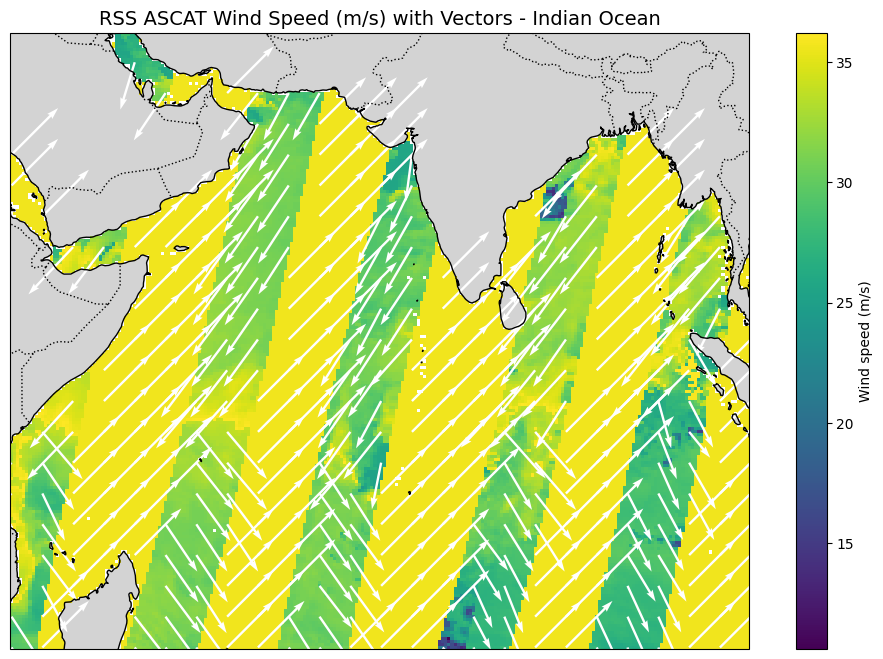

In [4]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors

# ===============================
# INPUT NetCDF
# ===============================
infile = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.decoded_rss.nc"
ds = xr.open_dataset(infile)

# ===============================
# REGION SELECTION (Indian Ocean)
# Lon: 40E - 100E, Lat: -20 to 30
# ===============================
lon_min, lon_max = 40, 100
lat_min, lat_max = -20, 30
ds_region = ds.sel(lon=slice(lon_min, lon_max), lat=slice(lat_min, lat_max))

# ===============================
# Variables
# ===============================
wspd = ds_region['wind_speed'].values
u = ds_region['u'].values
v = ds_region['v'].values
lon = ds_region['lon'].values
lat = ds_region['lat'].values

# Mask invalid values (NaNs)
wspd = np.ma.masked_invalid(wspd)
u = np.ma.masked_invalid(u)
v = np.ma.masked_invalid(v)

# ===============================
# Downsample AFTER masking
# ===============================
stride = 10
u_ds = u[::stride, ::stride]
v_ds = v[::stride, ::stride]
lon_ds = lon[::stride]
lat_ds = lat[::stride]
lon2d, lat2d = np.meshgrid(lon_ds, lat_ds)

# Apply same mask to vectors
mask_ds = ~(u_ds.mask | v_ds.mask)

# ===============================
# PLOT
# ===============================
plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Make colormap transparent for NaNs
cmap = plt.cm.viridis.copy()
cmap.set_bad(color='none')

# Wind speed colormap (masked)
c = ax.pcolormesh(lon, lat, wspd, cmap=cmap, shading='auto')

# Overlay vectors only at valid points
ax.quiver(lon2d[mask_ds], lat2d[mask_ds],
          u_ds[mask_ds], v_ds[mask_ds],
          color='white', scale=400)

# Coastlines & features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')

# Colorbar
cb = plt.colorbar(c, ax=ax, orientation='vertical', label='Wind speed (m/s)')

# Titles
plt.title("RSS ASCAT Wind Speed (m/s) with Vectors - Indian Ocean", fontsize=14)

plt.show()


In [5]:
import xarray as xr

# ===============================
# INPUT NetCDF FILE
# ===============================
infile = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.decoded_rss.nc"

# Open dataset
ds = xr.open_dataset(infile)

# Print full structure
print("\n================ DIMENSIONS ================")
print(ds.dims)

print("\n================ COORDINATES ================")
for name, coord in ds.coords.items():
    print(f"{name}: {coord.values[:10]} ... shape={coord.shape}")

print("\n================ VARIABLES ================")
for name, var in ds.data_vars.items():
    print(f"\n{name} (shape {var.shape})")
    print(f"  dtype: {var.dtype}")
    for attr, val in var.attrs.items():
        print(f"  {attr}: {val}")

print("\n================ GLOBAL ATTRIBUTES ================")
for attr, val in ds.attrs.items():
    print(f"{attr}: {val}")

# Close dataset
ds.close()



================ DIMENSIONS ================
FrozenMappingWarningOnValuesAccess({'lat': 720, 'lon': 1440})

================ COORDINATES ================
lat: [-89.875 -89.625 -89.375 -89.125 -88.875 -88.625 -88.375 -88.125 -87.875
 -87.625] ... shape=(720,)
lon: [0.125 0.375 0.625 0.875 1.125 1.375 1.625 1.875 2.125 2.375] ... shape=(1440,)

================ VARIABLES ================

wind_speed (shape (720, 1440))
  dtype: float32
  units: m s-1
  computed_from: u,v

wind_dir (shape (720, 1440))
  dtype: float32
  units: degrees
  computed_from: u,v

u (shape (720, 1440))
  dtype: float32
  units: m s-1
  original_band: band_03
  scale_applied: 0.2
  offset_applied: -128.0
  missing_byte: 255

v (shape (720, 1440))
  dtype: float32
  units: m s-1
  original_band: band_04
  scale_applied: 0.2
  offset_applied: -128.0
  missing_byte: 255

nobs (shape (720, 1440))
  dtype: float32
  units: count
  original_band: band_05
  scale_applied: 1.0
  offset_applied: 0.0
  missing_byte: 255

t

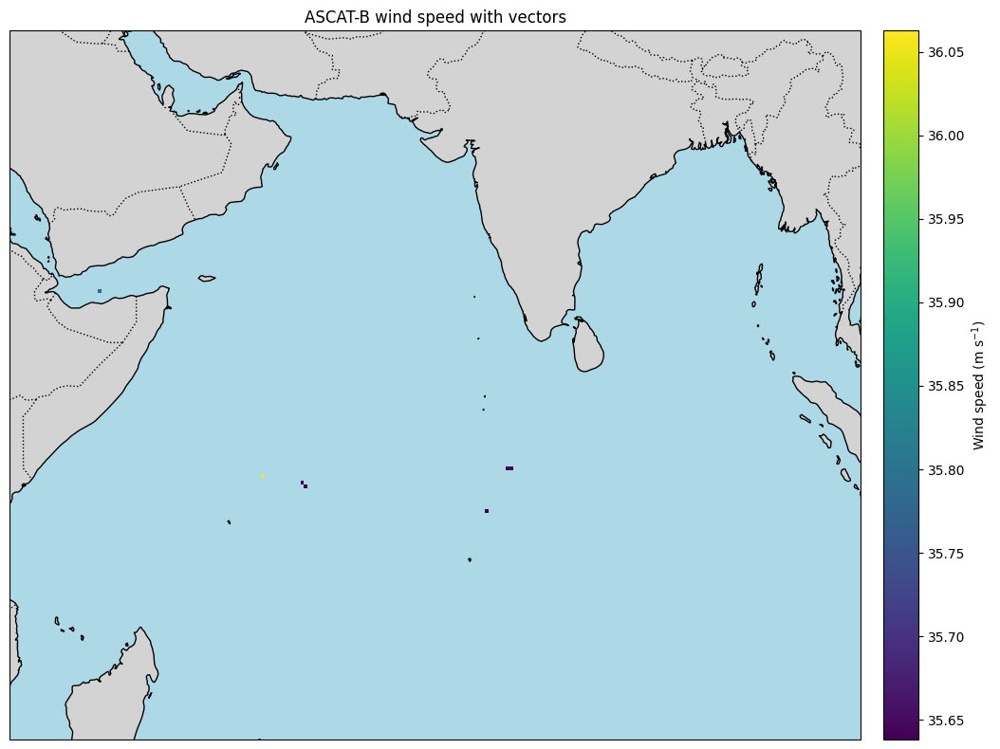

In [25]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors

# ===============================
# INPUT
# ===============================
infile = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.decoded_rss.nc"
ds = xr.open_dataset(infile)

# Optional region (Indian Ocean). Set use_region=False for global.
use_region = True
lon_min, lon_max = 40, 100
lat_min, lat_max = -20, 30
if use_region:
    ds = ds.sel(lon=slice(lon_min, lon_max), lat=slice(lat_min, lat_max))

# ===============================
# READ VARIABLES
# ===============================
lon = ds["lon"].values
lat = ds["lat"].values
wspd = ds["wind_speed"].values
u = ds["u"].values
v = ds["v"].values

# ===============================
# BUILD MASK
# - start with finite values only
# - optionally exclude land, ice, and rain contamination if present
# ===============================
mask = np.isfinite(wspd) & np.isfinite(u) & np.isfinite(v)

if "land" in ds:
    land = ds["land"].values
    mask &= ~(land > 0.5)          # keep where land flag is not set

if "ice" in ds:
    ice = ds["ice"].values
    mask &= ~(ice > 0.5)           # keep where ice flag is not set

# Rain flags (if present). Comment out if you do not want to filter rain.
if "rain_scatter" in ds:
    mask &= ~(ds["rain_scatter"].values > 0.5)
if "rain_colloc" in ds:
    mask &= ~(ds["rain_colloc"].values > 0.5)

# Number of obs (if present) must be > 0
if "nobs" in ds:
    mask &= (ds["nobs"].values > 0)

# Apply mask
wspd_ma = np.ma.array(wspd, mask=~mask)
u_ma = np.ma.array(u, mask=~mask)
v_ma = np.ma.array(v, mask=~mask)

# Downsample vectors for clarity AFTER masking
stride = 10
lon_ds = lon[::stride]
lat_ds = lat[::stride]
u_ds = u_ma[::stride, ::stride]
v_ds = v_ma[::stride, ::stride]

lon2d, lat2d = np.meshgrid(lon_ds, lat_ds)
vec_mask = ~(u_ds.mask | v_ds.mask)

# ===============================
# PLOT
# ===============================
plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Transparent colormap for masked cells
cmap = plt.cm.viridis.copy()
cmap.set_bad(color='none')

# Wind speed shading (no color where masked)
pcm = ax.pcolormesh(
    lon, lat, wspd_ma,
    cmap=cmap, shading='auto',
    transform=ccrs.PlateCarree()
)

# Vectors only at valid points
ax.quiver(
    lon2d[vec_mask], lat2d[vec_mask],
    u_ds[vec_mask], v_ds[vec_mask],
    color='white', scale=400, width=0.0022,
    transform=ccrs.PlateCarree()
)

# Map features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Optional extent
if use_region:
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Colorbar and title
cb = plt.colorbar(pcm, ax=ax, orientation='vertical', pad=0.02)
cb.set_label('Wind speed (m s$^{-1}$)')

plt.title('ASCAT-B wind speed with vectors')
plt.tight_layout()
plt.show()


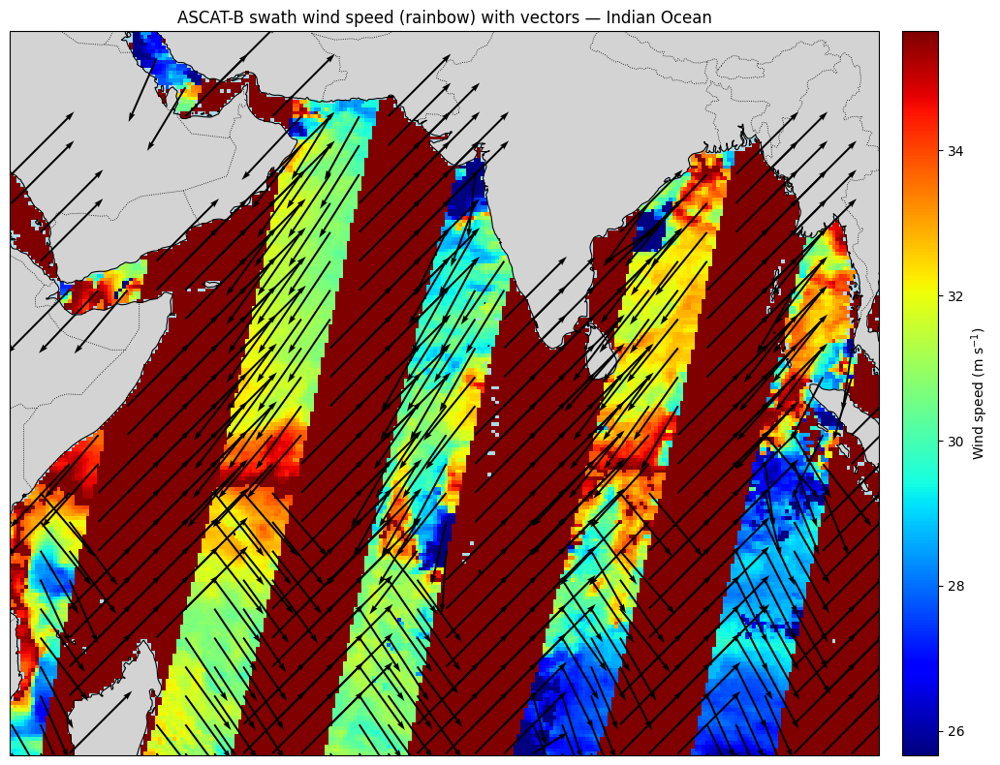

In [9]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ===============================
# INPUT
# ===============================
infile = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascatb_20250615_v02.1.decoded_rss.nc"
ds = xr.open_dataset(infile)

# ===============================
# REGION: Indian Ocean (40E–100E, 20S–30N)
# ===============================
lon_min, lon_max = 40, 100
lat_min, lat_max = -20, 30
dsR = ds.sel(lon=slice(lon_min, lon_max), lat=slice(lat_min, lat_max))

lon = dsR["lon"].values
lat = dsR["lat"].values
u = dsR["u"].values
v = dsR["v"].values
wspd = dsR["wind_speed"].values

# ===============================
# MASK: plot only where data exist (no aggressive flag filtering)
# ===============================
mask = np.isfinite(wspd) & np.isfinite(u) & np.isfinite(v)
# Optional: require at least one observation if nobs exists
if "nobs" in dsR:
    mask &= dsR["nobs"].values > 0

# Apply mask
wspd_ma = np.ma.array(wspd, mask=~mask)
u_ma = np.ma.array(u, mask=~mask)
v_ma = np.ma.array(v, mask=~mask)

# ===============================
# Vector thinning AFTER masking
# ===============================
stride = 8  # adjust if you want more/less arrows
lon2d, lat2d = np.meshgrid(lon, lat)
u_ds = u_ma[::stride, ::stride]
v_ds = v_ma[::stride, ::stride]
lon_ds = lon2d[::stride, ::stride]
lat_ds = lat2d[::stride, ::stride]
vec_mask = ~(u_ds.mask | v_ds.mask)

# ===============================
# Color limits from robust percentiles (nice dynamic range)
# ===============================
valid_ws = wspd_ma.compressed()
if valid_ws.size:
    vmin = max(0.0, np.percentile(valid_ws, 1))
    vmax = np.percentile(valid_ws, 99)
else:
    vmin, vmax = 0.0, 25.0

# ===============================
# PLOT
# ===============================
plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Rainbow colormap; hide missing as transparent
cmap = plt.cm.jet.copy()
cmap.set_bad(color='none')

# Wind speed swath (only where valid)
pc = ax.pcolormesh(
    lon, lat, wspd_ma,
    cmap=cmap, shading='auto',
    vmin=vmin, vmax=vmax,
    transform=ccrs.PlateCarree()
)

# Vectors only at valid swath points
ax.quiver(
    lon_ds[vec_mask], lat_ds[vec_mask],
    u_ds[vec_mask], v_ds[vec_mask],
    color='k', scale=350, width=0.0022,
    transform=ccrs.PlateCarree()
)

# Map features
ax.coastlines(resolution='50m', linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Colorbar
cb = plt.colorbar(pc, ax=ax, orientation='vertical', pad=0.02)
cb.set_label('Wind speed (m s$^{-1}$)')

plt.title('ASCAT-B swath wind speed (rainbow) with vectors — Indian Ocean')
plt.tight_layout()
plt.show()


In [26]:
import xarray as xr

# File path
file_path = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_20250816_010000_metopb_66991_eps_o_coa_3301_ovw.l2.nc"

# Open dataset
ds = xr.open_dataset(file_path)

# Print basic info: dimensions, variables, coordinates
print("=== Dataset Info ===")
print(ds)

# Print detailed info about each variable
print("\n=== Variables and Attributes ===")
for var in ds.data_vars:
    print(f"\nVariable: {var}")
    print(ds[var])
    if 'units' in ds[var].attrs:
        print(f"Units: {ds[var].attrs['units']}")
    else:
        print("Units: Not specified")

# Print global attributes
print("\n=== Global Attributes ===")
print(ds.attrs)


=== Dataset Info ===
<xarray.Dataset> Size: 15MB
Dimensions:           (NUMROWS: 3264, NUMCELLS: 82)
Coordinates:
    lat               (NUMROWS, NUMCELLS) float32 1MB ...
    lon               (NUMROWS, NUMCELLS) float32 1MB ...
Dimensions without coordinates: NUMROWS, NUMCELLS
Data variables:
    time              (NUMROWS, NUMCELLS) datetime64[ns] 2MB ...
    wvc_index         (NUMROWS, NUMCELLS) float32 1MB ...
    model_speed       (NUMROWS, NUMCELLS) float32 1MB ...
    model_dir         (NUMROWS, NUMCELLS) float32 1MB ...
    ice_prob          (NUMROWS, NUMCELLS) float32 1MB ...
    ice_age           (NUMROWS, NUMCELLS) float32 1MB ...
    wvc_quality_flag  (NUMROWS, NUMCELLS) float64 2MB ...
    wind_speed        (NUMROWS, NUMCELLS) float32 1MB ...
    wind_dir          (NUMROWS, NUMCELLS) float32 1MB ...
    bs_distance       (NUMROWS, NUMCELLS) float32 1MB ...
Attributes: (12/29)
    title:                            MetOp-B ASCAT Level 2 Coastal Ocean Sur...
    title_short_

C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

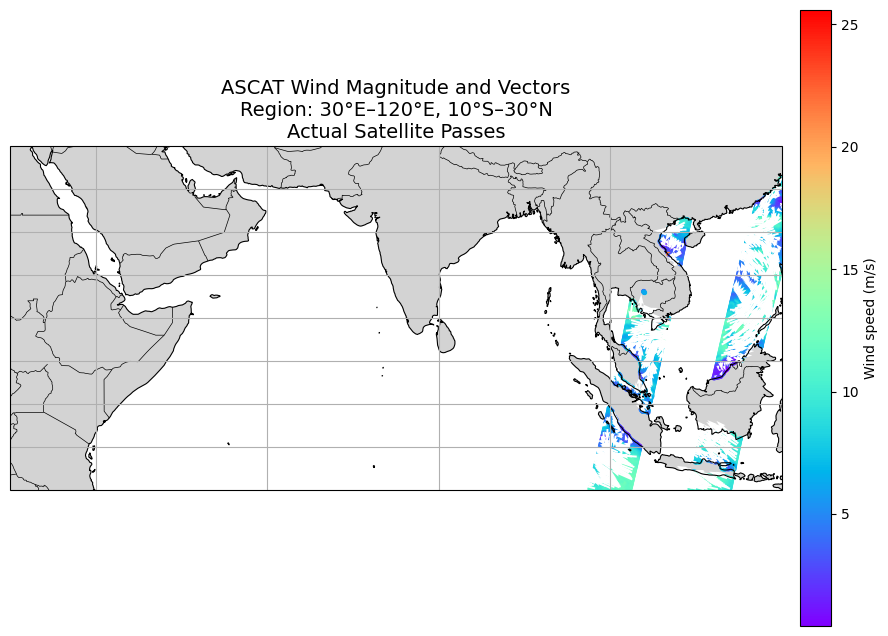

In [46]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ------------------------
# File path
# ------------------------
file_path = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_20250816_010000_metopb_66991_eps_o_coa_3301_ovw.l2.nc"

# ------------------------
# Open dataset
# ------------------------
ds = xr.open_dataset(file_path)

# Extract lat/lon and wind
lat = ds['lat'].values
lon = ds['lon'].values
wind_speed = ds['wind_speed'].values
wind_dir = ds['wind_dir'].values

# Convert wind direction to radians (0° = North)
theta = np.deg2rad(wind_dir)

# Compute u, v components
u = wind_speed * np.sin(theta)
v = wind_speed * np.cos(theta)

# ------------------------
# Mask invalid wind speeds
# ------------------------
mask_valid = (wind_speed >= 0) & (wind_speed <= 50)
lat = np.where(mask_valid, lat, np.nan)
lon = np.where(mask_valid, lon, np.nan)
wind_speed = np.where(mask_valid, wind_speed, np.nan)
u = np.where(mask_valid, u, np.nan)
v = np.where(mask_valid, v, np.nan)

# ------------------------
# Restrict to exact region: lon 30–120E, lat -10–30N
# ------------------------
mask_region = (lon >= 30) & (lon <= 120) & (lat >= -10) & (lat <= 30)
lat = np.where(mask_region, lat, np.nan)
lon = np.where(mask_region, lon, np.nan)
wind_speed = np.where(mask_region, wind_speed, np.nan)
u = np.where(mask_region, u, np.nan)
v = np.where(mask_region, v, np.nan)

# ------------------------
# Remove NaNs for plotting
# ------------------------
valid = ~np.isnan(wind_speed)
lat_plot = lat[valid]
lon_plot = lon[valid]
wind_plot = wind_speed[valid]
u_plot = u[valid]
v_plot = v[valid]

# ------------------------
# Plotting
# ------------------------
plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot wind speed magnitude as scatter
sc = ax.scatter(lon_plot, lat_plot, c=wind_plot, cmap='rainbow', s=12, marker='o', edgecolor='none')

# Overlay vectors (subsample for clarity)
skip = 20  # adjust for vector density
ax.quiver(lon_plot[::skip], lat_plot[::skip], u_plot[::skip], v_plot[::skip],
          scale=400, width=0.0025, color='white')

# Land filled with gray
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

# Set exact region
ax.set_extent([30, 120, -10, 30], crs=ccrs.PlateCarree())

# Remove gridlines
ax.gridlines(draw_labels=False)

# Colorbar
cbar = plt.colorbar(sc, orientation='vertical', pad=0.02)
cbar.set_label('Wind speed (m/s)')

# Title
ax.set_title('ASCAT Wind Magnitude and Vectors\nRegion: 30°E–120°E, 10°S–30°N\nActual Satellite Passes', fontsize=14)

plt.show()


In [1]:
import os
import xarray as xr

# Folder containing your NetCDF files
folder = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"

# List all .nc files in the folder
nc_files = [f for f in os.listdir(folder) if f.endswith('.nc')]

if not nc_files:
    print("No NetCDF files found in the folder.")
else:
    for nc_file in nc_files:
        file_path = os.path.join(folder, nc_file)
        print(f"\n=== File: {nc_file} ===")
        
        # Open dataset using xarray
        ds = xr.open_dataset(file_path)
        
        print("Dimensions:")
        for dim_name, dim_size in ds.dims.items():
            print(f"  {dim_name}: {dim_size}")
        
        print("\nVariables:")
        for var_name, var in ds.variables.items():
            units = var.attrs.get('units', 'N/A')
            print(f"  {var_name} (units: {units}) - shape: {var.shape}")
        
        print("\nAttributes:")
        for attr_name, attr_value in ds.attrs.items():
            print(f"  {attr_name}: {attr_value}")
        
        ds.close()



=== File: ascat_20250711_000600_metopb_66479_eps_o_coa_3301_ovw.l2.nc ===


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

Dimensions:
  NUMROWS: 3168
  NUMCELLS: 82

Variables:
  time (units: N/A) - shape: (3168, 82)
  lat (units: degrees_north) - shape: (3168, 82)
  lon (units: degrees_east) - shape: (3168, 82)
  wvc_index (units: 1) - shape: (3168, 82)
  model_speed (units: m s-1) - shape: (3168, 82)
  model_dir (units: degree) - shape: (3168, 82)
  ice_prob (units: 1) - shape: (3168, 82)
  ice_age (units: dB) - shape: (3168, 82)
  wvc_quality_flag (units: N/A) - shape: (3168, 82)
  wind_speed (units: m s-1) - shape: (3168, 82)
  wind_dir (units: degree) - shape: (3168, 82)
  bs_distance (units: 1) - shape: (3168, 82)

Attributes:
  title: MetOp-B ASCAT Level 2 Coastal Ocean Surface Wind Vector Product
  title_short_name: ASCATB-L2-Coastal
  Conventions: CF-1.6
  institution: EUMETSAT/OSI SAF/KNMI
  source: MetOp-B ASCAT
  software_identification_level_1: 1105
  instrument_calibration_version: 0
  software_identification_wind: 3301
  pixel_size_on_horizontal: 12.5 km
  service_type: eps
  processing_typ

C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

Dimensions:
  NUMROWS: 3264
  NUMCELLS: 82

Variables:
  time (units: N/A) - shape: (3264, 82)
  lat (units: degrees_north) - shape: (3264, 82)
  lon (units: degrees_east) - shape: (3264, 82)
  wvc_index (units: 1) - shape: (3264, 82)
  model_speed (units: m s-1) - shape: (3264, 82)
  model_dir (units: degree) - shape: (3264, 82)
  ice_prob (units: 1) - shape: (3264, 82)
  ice_age (units: dB) - shape: (3264, 82)
  wvc_quality_flag (units: N/A) - shape: (3264, 82)
  wind_speed (units: m s-1) - shape: (3264, 82)
  wind_dir (units: degree) - shape: (3264, 82)
  bs_distance (units: 1) - shape: (3264, 82)

Attributes:
  title: MetOp-B ASCAT Level 2 Coastal Ocean Surface Wind Vector Product
  title_short_name: ASCATB-L2-Coastal
  Conventions: CF-1.6
  institution: EUMETSAT/OSI SAF/KNMI
  source: MetOp-B ASCAT
  software_identification_level_1: 1105
  instrument_calibration_version: 0
  software_identification_wind: 3301
  pixel_size_on_horizontal: 12.5 km
  service_type: eps
  processing_typ

C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

In [2]:
import os
import xarray as xr

# Folder containing NetCDF files
folder = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"

# List all .nc files
nc_files = [f for f in os.listdir(folder) if f.endswith('.nc')]

if not nc_files:
    print("No NetCDF files found.")
else:
    for nc_file in nc_files:
        file_path = os.path.join(folder, nc_file)
        print(f"\n=== File: {nc_file} ===")
        
        ds = xr.open_dataset(file_path)
        
        print("Dimensions:")
        for dim_name, dim_size in ds.dims.items():
            print(f"  {dim_name}: {dim_size}")
        
        print("\nVariables:")
        for var_name, var in ds.variables.items():
            units = var.attrs.get('units', 'N/A')
            print(f"  {var_name} (units: {units}) - shape: {var.shape}")
        
        print("\nGlobal Attributes:")
        for attr_name, attr_value in ds.attrs.items():
            print(f"  {attr_name}: {attr_value}")
        
        ds.close()



=== File: ascat_20250711_000600_metopb_66479_eps_o_coa_3301_ovw.l2.nc ===
Dimensions:
  NUMROWS: 3168
  NUMCELLS: 82

Variables:
  time (units: N/A) - shape: (3168, 82)
  lat (units: degrees_north) - shape: (3168, 82)
  lon (units: degrees_east) - shape: (3168, 82)
  wvc_index (units: 1) - shape: (3168, 82)
  model_speed (units: m s-1) - shape: (3168, 82)
  model_dir (units: degree) - shape: (3168, 82)
  ice_prob (units: 1) - shape: (3168, 82)
  ice_age (units: dB) - shape: (3168, 82)
  wvc_quality_flag (units: N/A) - shape: (3168, 82)
  wind_speed (units: m s-1) - shape: (3168, 82)
  wind_dir (units: degree) - shape: (3168, 82)
  bs_distance (units: 1) - shape: (3168, 82)

Global Attributes:
  title: MetOp-B ASCAT Level 2 Coastal Ocean Surface Wind Vector Product
  title_short_name: ASCATB-L2-Coastal
  Conventions: CF-1.6
  institution: EUMETSAT/OSI SAF/KNMI
  source: MetOp-B ASCAT
  software_identification_level_1: 1105
  instrument_calibration_version: 0
  software_identification_w

C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v


=== File: ascat_20250711_151800_metopb_66488_eps_o_coa_3301_ovw.l2.nc ===
Dimensions:
  NUMROWS: 3168
  NUMCELLS: 82

Variables:
  time (units: N/A) - shape: (3168, 82)
  lat (units: degrees_north) - shape: (3168, 82)
  lon (units: degrees_east) - shape: (3168, 82)
  wvc_index (units: 1) - shape: (3168, 82)
  model_speed (units: m s-1) - shape: (3168, 82)
  model_dir (units: degree) - shape: (3168, 82)
  ice_prob (units: 1) - shape: (3168, 82)
  ice_age (units: dB) - shape: (3168, 82)
  wvc_quality_flag (units: N/A) - shape: (3168, 82)
  wind_speed (units: m s-1) - shape: (3168, 82)
  wind_dir (units: degree) - shape: (3168, 82)
  bs_distance (units: 1) - shape: (3168, 82)

Global Attributes:
  title: MetOp-B ASCAT Level 2 Coastal Ocean Surface Wind Vector Product
  title_short_name: ASCATB-L2-Coastal
  Conventions: CF-1.6
  institution: EUMETSAT/OSI SAF/KNMI
  source: MetOp-B ASCAT
  software_identification_level_1: 1105
  instrument_calibration_version: 0
  software_identification_w

C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

Processing: ascat_20250711_000600_metopb_66479_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

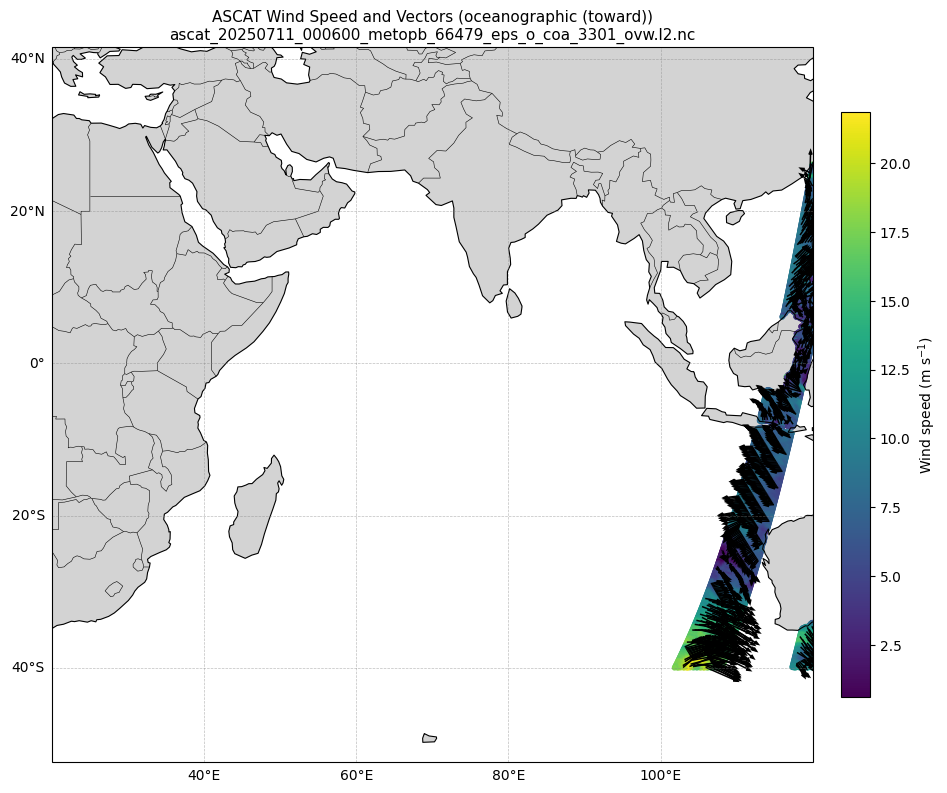

Processing: ascat_20250711_014500_metopb_66480_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

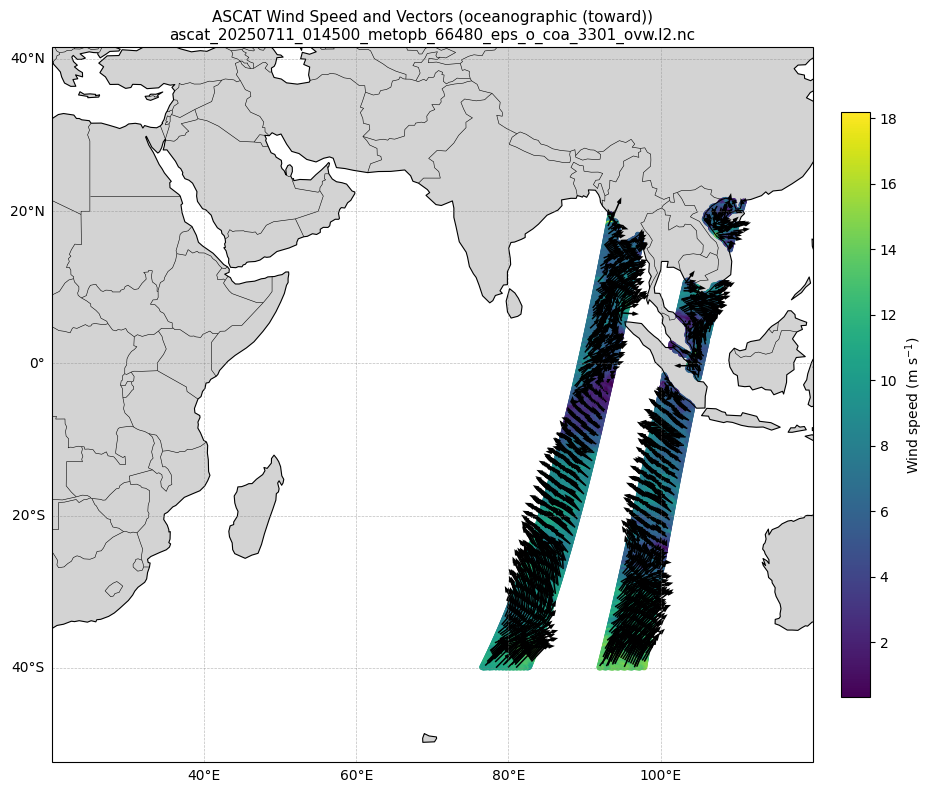

Processing: ascat_20250711_032700_metopb_66481_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

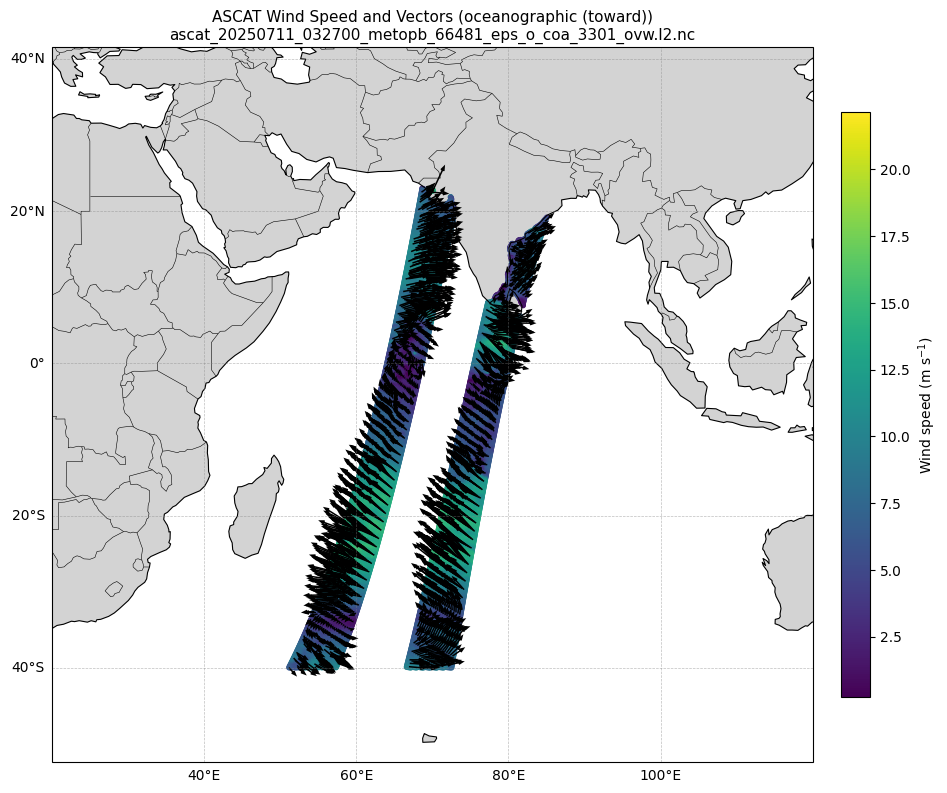

Processing: ascat_20250711_050900_metopb_66482_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

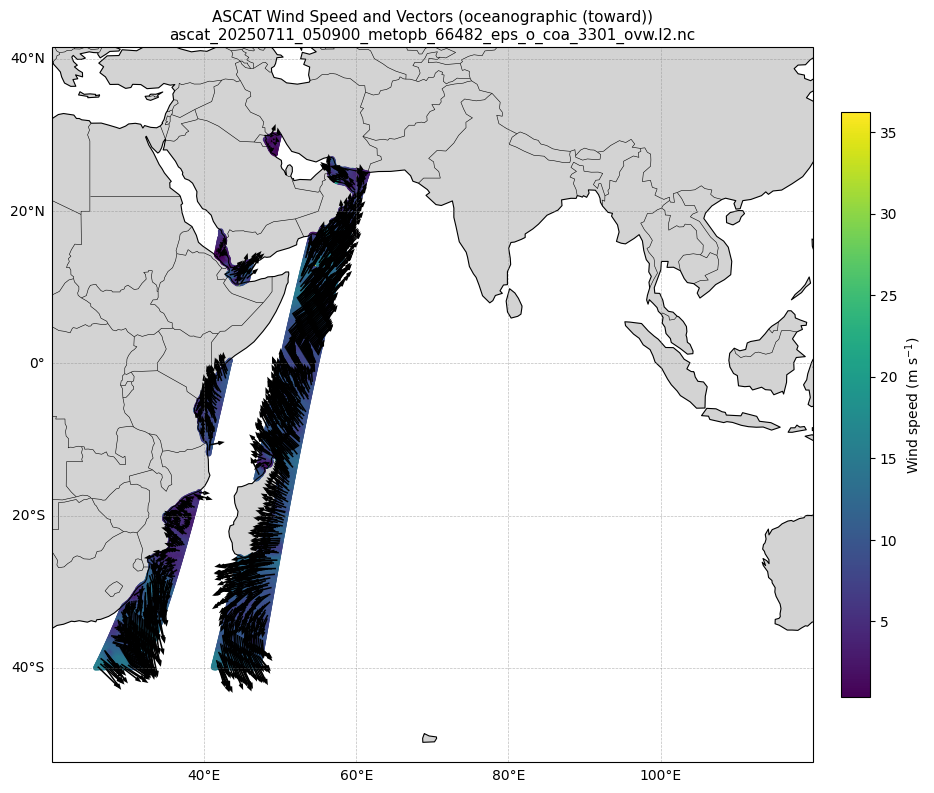

Processing: ascat_20250711_065100_metopb_66483_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

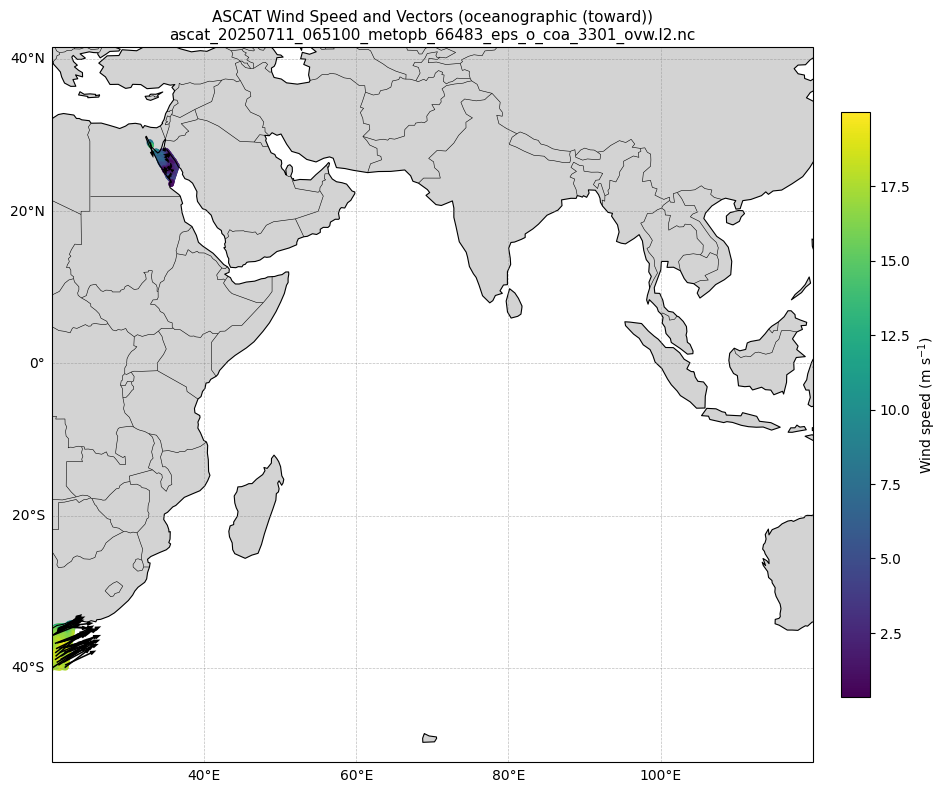

Processing: ascat_20250711_083000_metopb_66484_eps_o_coa_3301_ovw.l2.nc
No valid points in region for: ascat_20250711_083000_metopb_66484_eps_o_coa_3301_ovw.l2.nc
Processing: ascat_20250711_101200_metopb_66485_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

No valid points in region for: ascat_20250711_101200_metopb_66485_eps_o_coa_3301_ovw.l2.nc
Processing: ascat_20250711_115400_metopb_66486_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

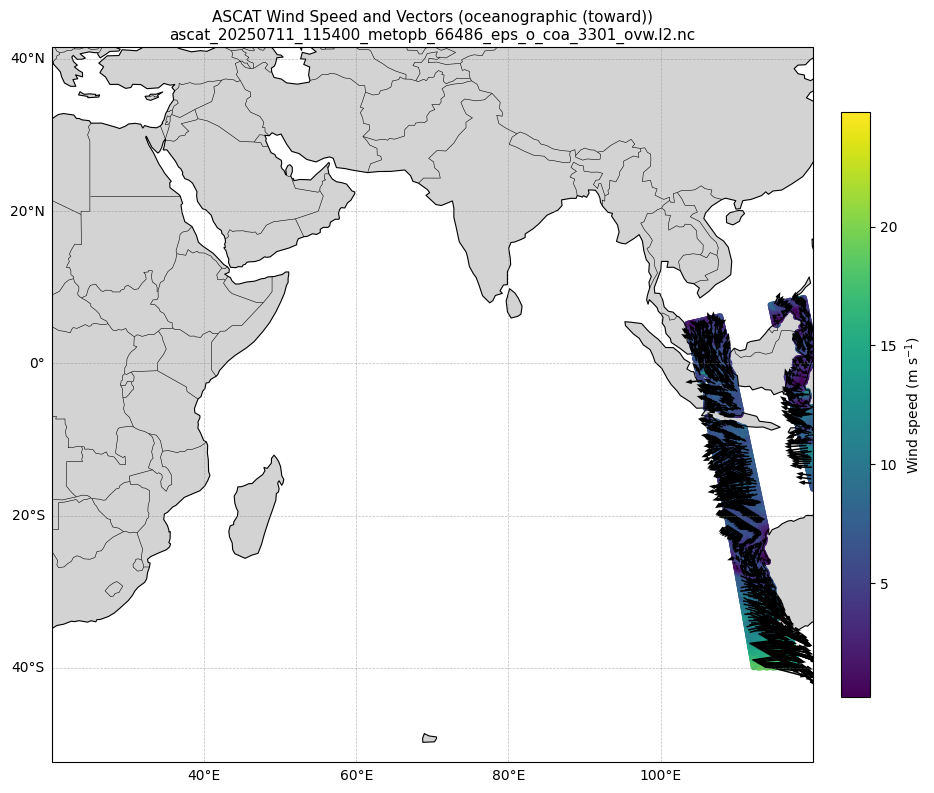

Processing: ascat_20250711_151800_metopb_66488_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

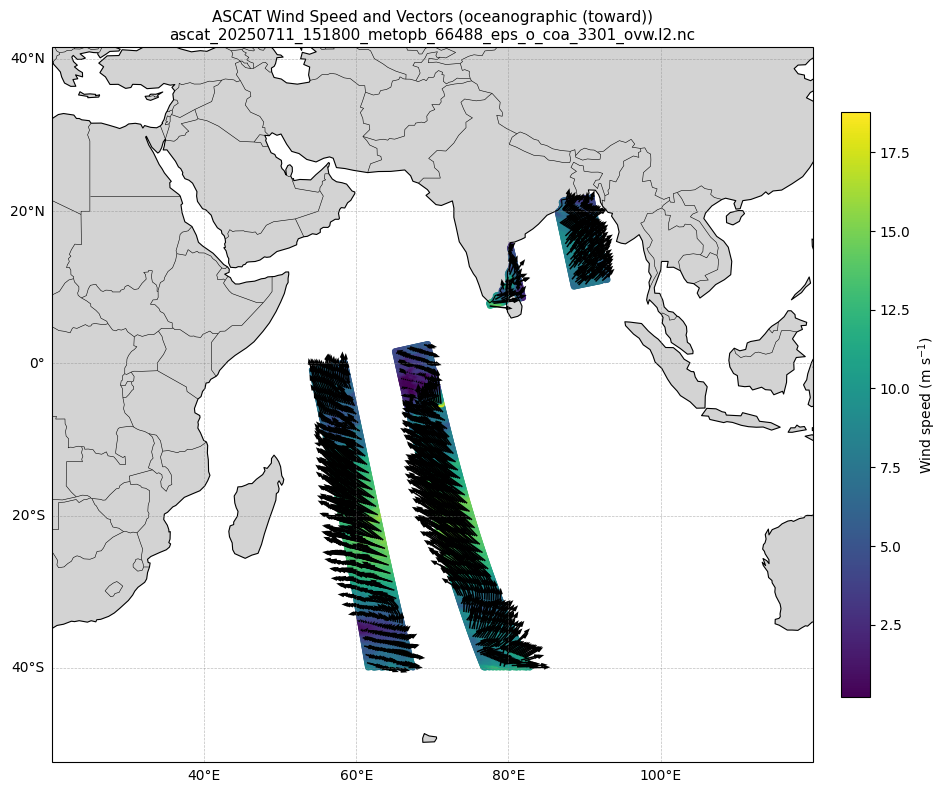

Processing: ascat_20250711_165700_metopb_66489_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

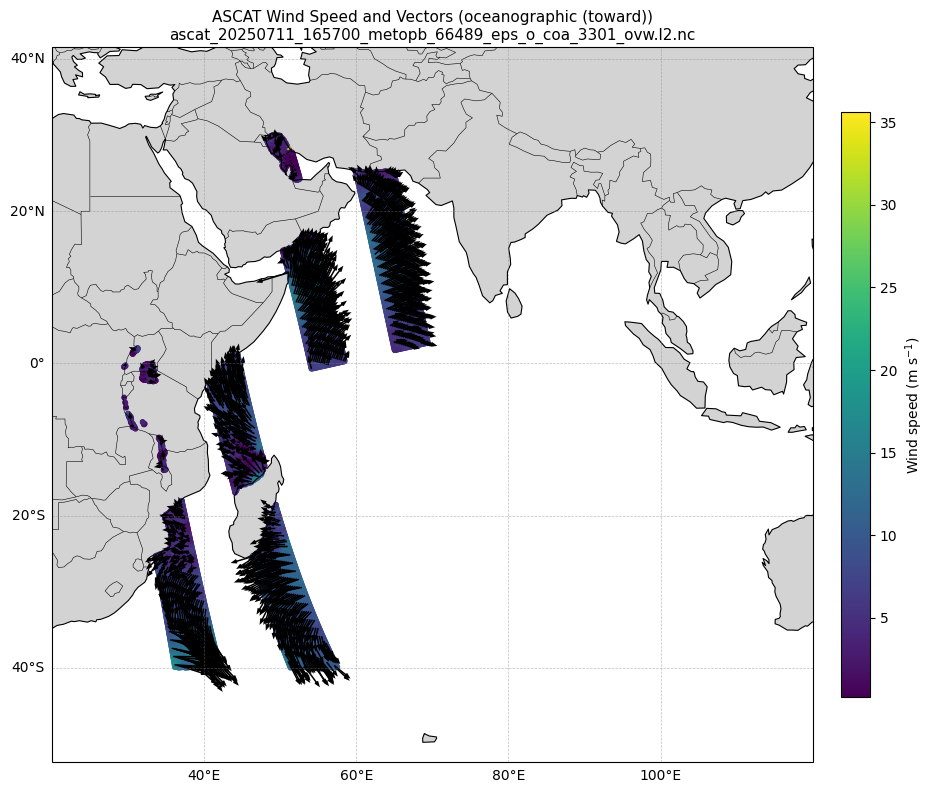

Processing: ascat_20250711_183900_metopb_66490_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

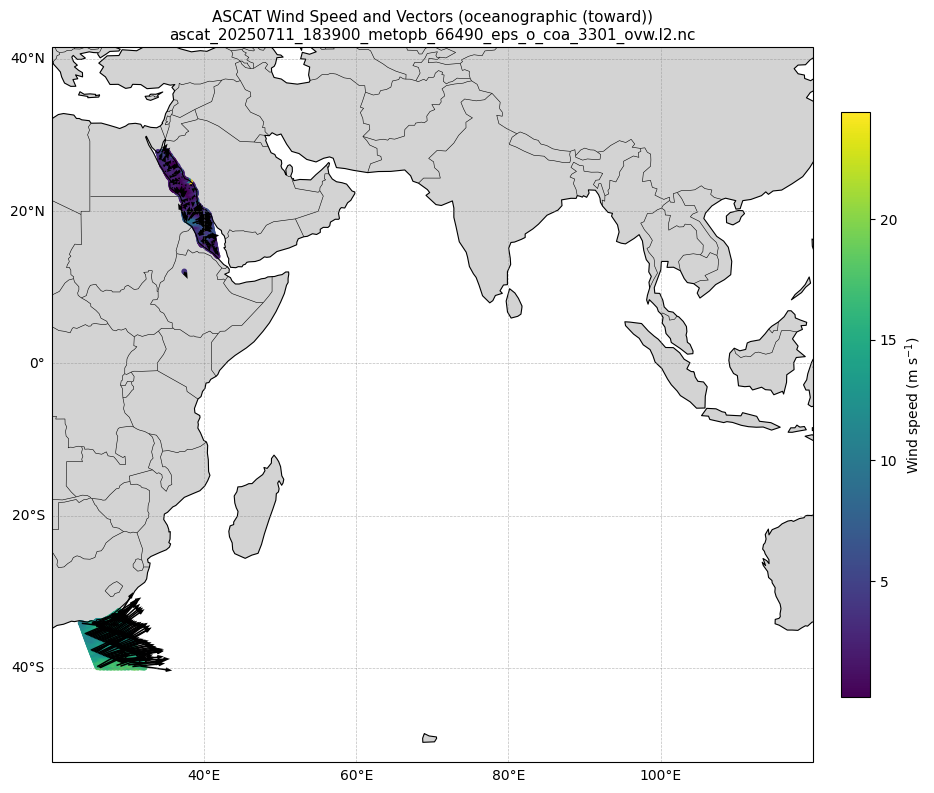

Processing: ascat_20250711_202100_metopb_66491_eps_o_coa_3301_ovw.l2.nc
No valid points in region for: ascat_20250711_202100_metopb_66491_eps_o_coa_3301_ovw.l2.nc
Processing: ascat_20250711_220300_metopb_66492_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

No valid points in region for: ascat_20250711_220300_metopb_66492_eps_o_coa_3301_ovw.l2.nc
Processing: ascat_20250711_234500_metopb_66493_eps_o_coa_3301_ovw.l2.nc


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

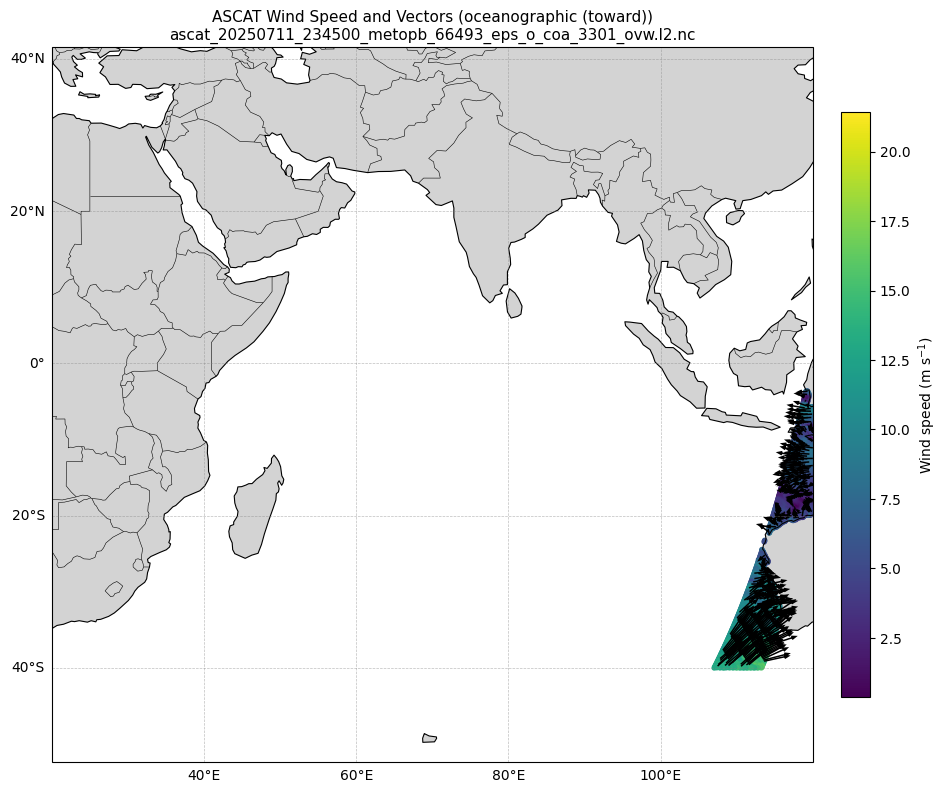

In [7]:
import os
from glob import glob
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# =========================================
# Settings
# =========================================
FOLDER = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"
SAVE_PNG = False  # set True to save figures next to the nc files
DPI = 180

# Indian Ocean region
LON_MIN, LON_MAX = 20, 120
LAT_MIN, LAT_MAX = -40, 30

# Thinning for quiver (bigger -> fewer arrows)
QUIVER_STEP = 20  # keep every 20th valid point

# =========================================
# Helpers
# =========================================
def detect_oceanographic_convention(ds):
    """
    Returns True if wind_dir is oceanographic convention (direction toward),
    otherwise False (meteorological from-direction).
    """
    texts = []
    # global attrs
    for k in ("comment", "history", "references", "title"):
        if k in ds.attrs and isinstance(ds.attrs[k], str):
            texts.append(ds.attrs[k])
    # variable attrs
    if "wind_dir" in ds.variables:
        vattrs = ds["wind_dir"].attrs
        for k, v in vattrs.items():
            if isinstance(v, str):
                texts.append(v)
    txt = " ".join(texts).lower()
    # common phrasing in your files: "oceanographic convention (0 deg. flowing North)"
    if "oceanographic" in txt or "flowing north" in txt or "direction toward" in txt:
        return True
    return False

def ensure_lon_range(lon_vals):
    """
    Keep as is if within [0, 360]. If longitudes are in [0, 360], Indian Ocean 20..120 is fine.
    If in [-180, 180], also fine. No wrap needed for 20..120.
    """
    return lon_vals

# =========================================
# Main
# =========================================
files = sorted(glob(os.path.join(FOLDER, "*.nc")))
if not files:
    print("No .nc files found in:", FOLDER)

for f in files:
    print("Processing:", os.path.basename(f))
    ds = xr.open_dataset(f)

    # Required variables
    wspd = ds["wind_speed"]  # m s-1
    wdir = ds["wind_dir"]    # degrees
    lon = ds["lon"]
    lat = ds["lat"]

    # Direction to radians
    theta = np.deg2rad(wdir)

    # Detect convention
    is_oceanographic = detect_oceanographic_convention(ds)

    # Compute u, v
    # Oceanographic: direction toward (0 North, 90 East) -> no minus
    # Meteorological: direction from   -> minus signs
    if is_oceanographic:
        u = wspd * np.sin(theta)
        v = wspd * np.cos(theta)
    else:
        u = -wspd * np.sin(theta)
        v = -wspd * np.cos(theta)

    # Clean up longitudes (not needed for 20..120 but keep function for completeness)
    lon = xr.DataArray(ensure_lon_range(lon.values), dims=lon.dims)

    # Build masks
    finite_mask = np.isfinite(lon) & np.isfinite(lat) & np.isfinite(wspd) & np.isfinite(u) & np.isfinite(v)
    region_mask = (lon >= LON_MIN) & (lon <= LON_MAX) & (lat >= LAT_MIN) & (lat <= LAT_MAX)
    mask = finite_mask & region_mask

    # If nothing valid, skip
    if not np.any(mask):
        print("No valid points in region for:", os.path.basename(f))
        ds.close()
        continue

    # Flatten valid points for scatter and quiver
    x = lon.values[mask]
    y = lat.values[mask]
    c = wspd.values[mask]
    u_flat = u.values[mask]
    v_flat = v.values[mask]

    # Quiver thinning
    idx = np.arange(x.size)
    q_idx = idx[::QUIVER_STEP]

    # Plot
    plt.figure(figsize=(10, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([LON_MIN, LON_MAX, LAT_MIN, LAT_MAX])

    # Map features
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linewidth=0.4)
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color="gray", alpha=0.5, linestyle="--")
    gl.top_labels = False
    gl.right_labels = False

    # Wind speed as scatter (handles irregular swath, NaNs already removed)
    sc = ax.scatter(x, y, c=c, s=9, transform=ccrs.PlateCarree())
    cbar = plt.colorbar(sc, ax=ax, orientation="vertical", shrink=0.8, pad=0.03)
    cbar.set_label("Wind speed (m s$^{-1}$)")

    # Vectors
    ax.quiver(x[q_idx], y[q_idx], u_flat[q_idx], v_flat[q_idx],
              transform=ccrs.PlateCarree(),
              scale=400, width=0.002, headwidth=3, headlength=4)

    conv_txt = "oceanographic (toward)" if is_oceanographic else "meteorological (from)"
    plt.title(f"ASCAT Wind Speed and Vectors ({conv_txt})\n{os.path.basename(f)}", fontsize=11)
    plt.tight_layout()

    if SAVE_PNG:
        out_png = os.path.splitext(f)[0] + "_indian_ocean.png"
        plt.savefig(out_png, dpi=DPI, bbox_inches="tight")
        print("Saved:", out_png)

    plt.show()
    ds.close()


In [4]:
"""
ascat_daily_region_merge.py

For each calendar day found among the .nc files in FOLDER:
 - read each file, subset to the given region (fast)
 - compute u,v from speed+dir (detecting convention)
 - aggregate all valid points from all passes that day -> save point-cloud NetCDF
 - create gridded products (binned mean + interpolated linear w/ nearest fallback) -> save gridded NetCDF

Requirements:
  numpy, xarray, scipy

Usage:
  python ascat_daily_region_merge.py
"""

import os
from glob import glob
from collections import defaultdict
import re
from datetime import datetime
import numpy as np
import xarray as xr
from scipy.interpolate import griddata
from scipy.stats import binned_statistic_2d

# ----------------------------
# USER PARAMETERS
# ----------------------------
FOLDER = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20241015"   # folder with ASCAT swath .nc files
OUT_FOLDER = os.path.join(FOLDER, "daily_region_output")
os.makedirs(OUT_FOLDER, exist_ok=True)

# Region and grid (change to your desired region)
LON_MIN, LON_MAX = 20.0, 120.0   # degrees East
LAT_MIN, LAT_MAX = -40.0, 30.0   # degrees North
RES_DEG = 0.25                   # grid resolution in degrees

# Conservative threshold: minimum number of valid points required to produce gridded file
MIN_POINTS_FOR_GRID = 20

# ----------------------------
# HELPERS
# ----------------------------
def detect_oceanographic_convention(ds):
    """Return True if wind_dir is oceanographic (direction TOWARD)."""
    txts = []
    for k in ("comment", "history", "references", "title"):
        if k in ds.attrs and isinstance(ds.attrs[k], str):
            txts.append(ds.attrs[k])
    if "wind_dir" in ds.variables:
        for ka, va in ds["wind_dir"].attrs.items():
            if isinstance(va, str):
                txts.append(va)
    txt = " ".join(txts).lower()
    if ("oceanographic" in txt) or ("direction toward" in txt) or ("toward" in txt and "wind" in txt):
        return True
    return False

def compute_uv_from_speed_dir(wspd_arr, wdir_arr, is_oceanographic):
    """Convert speed+direction arrays (deg) -> u,v (eastward,northward)."""
    theta = np.deg2rad(wdir_arr)
    if is_oceanographic:
        u = wspd_arr * np.sin(theta)
        v = wspd_arr * np.cos(theta)
    else:  # meteorological "from"
        u = -wspd_arr * np.sin(theta)
        v = -wspd_arr * np.cos(theta)
    return u, v

def make_regular_grid(lon_min, lon_max, lat_min, lat_max, res):
    lon_vec = np.arange(lon_min, lon_max + 1e-8, res)
    lat_vec = np.arange(lat_min, lat_max + 1e-8, res)
    Lon2d, Lat2d = np.meshgrid(lon_vec, lat_vec)
    return lon_vec, lat_vec, Lon2d, Lat2d

def normalize_lon_array(lon):
    """Return lon normalized into [0,360)."""
    return np.mod(lon, 360.0)

def point_in_region_mask(lon_arr, lat_arr, lon_min, lon_max, lat_min, lat_max):
    """
    Robust region mask handling lon in any convention.
    Returns boolean mask where points fall inside [lon_min,lon_max] x [lat_min,lat_max]
    Assumes lon_min,lon_max are in 0-360 or -180..180 but we compare both.
    """
    # as-read
    m1 = (lon_arr >= lon_min) & (lon_arr <= lon_max)
    # normalized to 0-360
    lon360 = normalize_lon_array(lon_arr)
    lonmin360 = normalize_lon_array(np.array(lon_min))
    lonmax360 = normalize_lon_array(np.array(lon_max))
    # handle wrapped lon_min>lon_max (e.g., 350->10)
    if lonmin360 <= lonmax360:
        m2 = (lon360 >= lonmin360) & (lon360 <= lonmax360)
    else:
        m2 = (lon360 >= lonmin360) | (lon360 <= lonmax360)
    mlat = (lat_arr >= lat_min) & (lat_arr <= lat_max)
    return (m1 | m2) & mlat

def guess_date_from_ds_or_filename(ds, filename):
    """
    Prefer time coordinate in dataset (first time value),
    else try to extract YYYYMMDD or YYYY-MM-DD from filename.
    Returns a datetime.date
    """
    # try dataset time coordinate
    time_var = None
    for key in ("time", "Time", "date"):
        if key in ds.variables:
            time_var = ds[key]
            break
    if time_var is not None:
        try:
            tval = xr.decode_cf(ds[[time_var.name]]).variables[time_var.name].values
            # tval may be array; take first and convert
            if np.ndim(tval) > 0:
                t0 = np.asarray(tval).ravel()[0]
            else:
                t0 = tval
            # convert numpy datetime64 to python datetime
            if np.issubdtype(type(t0), np.datetime64):
                dt = np.datetime64(t0).astype('datetime64[ms]').astype(datetime)
                return dt.date()
            else:
                try:
                    return pd.to_datetime(t0).date()
                except Exception:
                    pass
        except Exception:
            pass

    # fallback: parse filename for YYYYMMDD or YYYY-MM-DD
    base = os.path.basename(filename)
    m = re.search(r'(\d{4})[-_]?(\d{2})[-_]?(\d{2})', base)
    if m:
        y, mo, d = m.groups()
        return datetime(int(y), int(mo), int(d)).date()

    # last resort: use file modified date
    ts = os.path.getmtime(filename)
    return datetime.utcfromtimestamp(ts).date()

# ----------------------------
# MAIN
# ----------------------------
def main():
    files = sorted(glob(os.path.join(FOLDER, "*.nc")))
    if not files:
        raise FileNotFoundError(f"No .nc files found in folder: {FOLDER}")

    # group files by date
    files_by_date = defaultdict(list)
    print(f"Found {len(files)} files. Scanning headers for dates (fast subset will occur later)...")
    for fp in files:
        try:
            # open minimally to read time or attrs (no heavy data read)
            ds_head = xr.open_dataset(fp, decode_times=False, drop_variables=None)
        except Exception:
            # if open fails, still try to parse filename
            date = guess_date_from_ds_or_filename(xr.Dataset(), fp)
            files_by_date[date].append(fp)
            continue

        date = guess_date_from_ds_or_filename(ds_head, fp)
        files_by_date[date].append(fp)
        ds_head.close()

    print(f"Detected {len(files_by_date)} unique dates. Will process each date separately.")

    lon_vec, lat_vec, Lon2d, Lat2d = make_regular_grid(LON_MIN, LON_MAX, LAT_MIN, LAT_MAX, RES_DEG)

    for the_date, flist in sorted(files_by_date.items()):
        print(f"\nProcessing date {the_date} -> {len(flist)} file(s)")

        all_lon = []
        all_lat = []
        all_wspd = []
        all_wdir = []
        all_u = []
        all_v = []
        file_list = []

        for fp in flist:
            try:
                ds = xr.open_dataset(fp, decode_times=False)
            except Exception as e:
                print(f"  Skipping {os.path.basename(fp)} (open error): {e}")
                continue

            # check expected variable names; be a bit permissive
            candidates_lon = [v for v in ("lon", "longitude", "LONGITUDE", "lon_rho") if v in ds.variables]
            candidates_lat = [v for v in ("lat", "latitude", "LATITUDE", "lat_rho") if v in ds.variables]
            candidates_wspd = [v for v in ("wind_speed", "wind_speed_inst", "windSpeed", "wind_spd", "windspd") if v in ds.variables]
            candidates_wdir = [v for v in ("wind_dir", "wind_direction", "wind_dir_inst", "windDir", "winddir") if v in ds.variables]

            if not (candidates_lon and candidates_lat and candidates_wspd and candidates_wdir):
                print(f"  Skipping {os.path.basename(fp)} (required vars missing).")
                ds.close()
                continue

            lon_name = candidates_lon[0]
            lat_name = candidates_lat[0]
            wspd_name = candidates_wspd[0]
            wdir_name = candidates_wdir[0]

            lon_da = ds[lon_name].values
            lat_da = ds[lat_name].values
            wspd_da = ds[wspd_name].values
            wdir_da = ds[wdir_name].values

            # detect convention
            is_oceanographic = detect_oceanographic_convention(ds)

            # compute u,v (works elementwise; may load arrays)
            try:
                u_da, v_da = compute_uv_from_speed_dir(wspd_da, wdir_da, is_oceanographic)
            except Exception as e:
                print(f"  Error computing u/v for {os.path.basename(fp)}: {e}")
                ds.close()
                continue

            # region mask (robust to lon conventions)
            mask = point_in_region_mask(lon_da, lat_da, LON_MIN, LON_MAX, LAT_MIN, LAT_MAX)

            # finite mask
            finite_mask = np.isfinite(lon_da) & np.isfinite(lat_da) & np.isfinite(wspd_da) & np.isfinite(wdir_da) & np.isfinite(u_da) & np.isfinite(v_da)
            final_mask = mask & finite_mask

            n_valid = np.count_nonzero(final_mask)
            if n_valid == 0:
                print(f"  {os.path.basename(fp)} -> no valid points in region, skip")
                ds.close()
                continue

            # flatten and append
            lon_flat = lon_da[final_mask].ravel()
            lat_flat = lat_da[final_mask].ravel()
            wspd_flat = wspd_da[final_mask].ravel()
            wdir_flat = wdir_da[final_mask].ravel()
            u_flat = u_da[final_mask].ravel()
            v_flat = v_da[final_mask].ravel()

            all_lon.append(lon_flat)
            all_lat.append(lat_flat)
            all_wspd.append(wspd_flat)
            all_wdir.append(wdir_flat)
            all_u.append(u_flat)
            all_v.append(v_flat)
            file_list.append(os.path.basename(fp))

            print(f"  {os.path.basename(fp)} -> valid points: {n_valid}")
            ds.close()

        if len(all_lon) == 0:
            print(f"  No valid points for {the_date}, skipping output.")
            continue

        x = np.concatenate(all_lon)
        y = np.concatenate(all_lat)
        wspd = np.concatenate(all_wspd)
        wdir = np.concatenate(all_wdir)
        u = np.concatenate(all_u)
        v = np.concatenate(all_v)

        # filenames for outputs
        date_str = the_date.strftime("%Y%m%d")
        out_points = os.path.join(OUT_FOLDER, f"ascat_points_{date_str}.nc")
        out_grid = os.path.join(OUT_FOLDER, f"ascat_gridded_{date_str}.nc")

        # Save point-cloud
        npoints = x.size
        ds_points = xr.Dataset(
            data_vars={
                "lon": (("point",), x, {"units":"degrees_east"}),
                "lat": (("point",), y, {"units":"degrees_north"}),
                "wind_speed": (("point",), wspd, {"units":"m s-1"}),
                "wind_dir": (("point",), wdir, {"units":"degrees"}),
                "u_obs": (("point",), u, {"units":"m s-1", "long_name":"eastward_wind"}),
                "v_obs": (("point",), v, {"units":"m s-1", "long_name":"northward_wind"}),
            },
            coords={"point": np.arange(npoints)},
            attrs={
                "source_files": ", ".join(sorted(set(file_list))),
                "region": f"[{LON_MIN},{LON_MAX}] x [{LAT_MIN},{LAT_MAX}]",
                "date": date_str,
                "description": "Point-cloud of ASCAT observations merged for this day inside the chosen region."
            }
        )
        ds_points.to_netcdf(out_points)
        print(f"  Saved point-cloud: {out_points}")

        # If too few points, skip gridding (avoid noisy grid)
        if x.size < MIN_POINTS_FOR_GRID:
            print(f"  Only {x.size} points < {MIN_POINTS_FOR_GRID} threshold -> skip gridded output.")
            continue

        # Create binned (cell-mean) product
        lon_vec = np.arange(LON_MIN, LON_MAX + 1e-8, RES_DEG)
        lat_vec = np.arange(LAT_MIN, LAT_MAX + 1e-8, RES_DEG)
        nx = lon_vec.size
        ny = lat_vec.size

        lon_edges = np.linspace(LON_MIN, LON_MAX, nx+1)
        lat_edges = np.linspace(LAT_MIN, LAT_MAX, ny+1)

        stat_u, _, _, _ = binned_statistic_2d(x, y, u, statistic='mean', bins=[lon_edges, lat_edges])
        stat_v, _, _, _ = binned_statistic_2d(x, y, v, statistic='mean', bins=[lon_edges, lat_edges])
        stat_s, _, _, _ = binned_statistic_2d(x, y, wspd, statistic='mean', bins=[lon_edges, lat_edges])

        u_binned = np.transpose(stat_u)  # (ny, nx)
        v_binned = np.transpose(stat_v)
        s_binned = np.transpose(stat_s)

        # Interpolated grid (linear + nearest fallback)
        Lon2d, Lat2d = np.meshgrid(lon_vec, lat_vec)
        points = np.column_stack((x, y))

        u_lin = griddata(points, u, (Lon2d, Lat2d), method='linear')
        v_lin = griddata(points, v, (Lon2d, Lat2d), method='linear')
        s_lin = griddata(points, wspd, (Lon2d, Lat2d), method='linear')

        # nearest fallback for NaNs
        if not np.all(np.isfinite(u_lin)):
            u_near = griddata(points, u, (Lon2d, Lat2d), method='nearest')
            u_lin[~np.isfinite(u_lin)] = u_near[~np.isfinite(u_lin)]
        if not np.all(np.isfinite(v_lin)):
            v_near = griddata(points, v, (Lon2d, Lat2d), method='nearest')
            v_lin[~np.isfinite(v_lin)] = v_near[~np.isfinite(v_lin)]
        if not np.all(np.isfinite(s_lin)):
            s_near = griddata(points, wspd, (Lon2d, Lat2d), method='nearest')
            s_lin[~np.isfinite(s_lin)] = s_near[~np.isfinite(s_lin)]

        # recompute speed from interpolated u/v for consistency
        s_from_uv = np.sqrt(u_lin**2 + v_lin**2)
        s_interp = np.where(np.isfinite(s_lin), s_lin, s_from_uv)

        # Save gridded dataset
        ds_grid = xr.Dataset(
            data_vars={
                "u_binned": (("lat","lon"), u_binned, {"units":"m s-1","long_name":"eastward_wind_binned_mean"}),
                "v_binned": (("lat","lon"), v_binned, {"units":"m s-1","long_name":"northward_wind_binned_mean"}),
                "wspd_binned": (("lat","lon"), s_binned, {"units":"m s-1","long_name":"wind_speed_binned_mean"}),
                "u_interp": (("lat","lon"), u_lin, {"units":"m s-1","long_name":"eastward_wind_interpolated_linear_nearest_fallback"}),
                "v_interp": (("lat","lon"), v_lin, {"units":"m s-1","long_name":"northward_wind_interpolated_linear_nearest_fallback"}),
                "wspd_interp": (("lat","lon"), s_interp, {"units":"m s-1","long_name":"wind_speed_interpolated"}),
            },
            coords={
                "lon": (("lon",), lon_vec, {"units":"degrees_east"}),
                "lat": (("lat",), lat_vec, {"units":"degrees_north"}),
            },
            attrs={
                "description": "Gridded ASCAT daily composite (binned + interpolated) for selected region.",
                "method_binned": "Binned mean per cell using scipy.stats.binned_statistic_2d (mean).",
                "method_interpolated": "Scattered linear interpolation (scipy.griddata) with nearest-neighbor fallback.",
                "original_point_cloud": out_points,
                "region": f"[{LON_MIN},{LON_MAX}] x [{LAT_MIN},{LAT_MAX}] deg",
                "grid_resolution_deg": RES_DEG,
                "date": date_str
            }
        )
        ds_grid.to_netcdf(out_grid)
        print(f"  Saved gridded file: {out_grid}")

    print("\nAll done.")

if __name__ == "__main__":
    main()


Found 28 files. Scanning headers for dates (fast subset will occur later)...


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

Detected 1 unique dates. Will process each date separately.

Processing date 2024-10-15 -> 28 file(s)
  ascat_20241015_002100_metopc_30815_eps_o_coa_3301_ovw.l2.nc -> valid points: 14349


C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'time' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lat' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'lon' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'wvc_index' has multiple fill values {1e+30, 1e+30} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python\Python312\Lib\site-packages\xarray\conventions.py:286: SerializationWarning: variable 'model_speed' has multiple fill v

  ascat_20241015_010600_metopb_62658_eps_o_coa_3301_ovw.l2.nc -> valid points: 36970
  ascat_20241015_020300_metopc_30816_eps_o_coa_3301_ovw.l2.nc -> valid points: 40710
  ascat_20241015_024800_metopb_62659_eps_o_coa_3301_ovw.l2.nc -> valid points: 42453
  ascat_20241015_034500_metopc_30817_eps_o_coa_3301_ovw.l2.nc -> valid points: 43779
  ascat_20241015_043000_metopb_62660_eps_o_coa_3301_ovw.l2.nc -> valid points: 44404
  ascat_20241015_052400_metopc_30818_eps_o_coa_3301_ovw.l2.nc -> valid points: 38951
  ascat_20241015_061200_metopb_62661_eps_o_coa_3301_ovw.l2.nc -> valid points: 10217
  ascat_20241015_070600_metopc_30819_eps_o_coa_3301_ovw.l2.nc -> valid points: 2980
  ascat_20241015_075100_metopb_62662_eps_o_coa_3301_ovw.l2.nc -> no valid points in region, skip
  ascat_20241015_084800_metopc_30820_eps_o_coa_3301_ovw.l2.nc -> no valid points in region, skip
  ascat_20241015_093300_metopb_62663_eps_o_coa_3301_ovw.l2.nc -> no valid points in region, skip
  ascat_20241015_103000_metopc

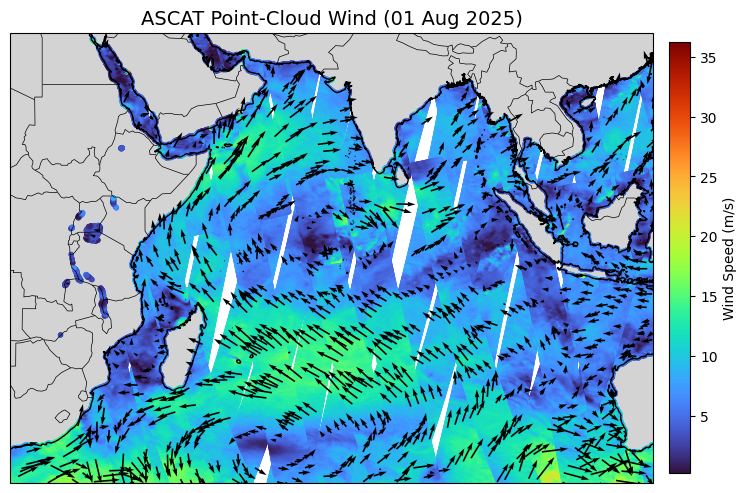

In [19]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ============================
# File path
# ============================
file_path = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250711\daily_region_output\ascat_points_20250711.nc"

# ============================
# Open dataset
# ============================
ds = xr.open_dataset(file_path)

# Extract variables
u = ds["u_obs"].values
v = ds["v_obs"].values
lat = ds["lat"].values
lon = ds["lon"].values
ws = ds["wind_speed"].values  # already stored

# ============================
# Plotting
# ============================
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(10,8), subplot_kw={"projection": proj})

# Add coastlines and features
ax.coastlines(resolution="10m", color="black", linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor="lightgray")

# Set region (based on your subset)
ax.set_extent([20, 120, -40, 30], crs=proj)

# Wind speed shading (scatter, since data are points not grid)
sc = ax.scatter(lon, lat, c=ws, cmap="turbo", s=8, transform=proj)
cbar = plt.colorbar(sc, ax=ax, orientation="vertical", shrink=0.7, pad=0.02)
cbar.set_label("Wind Speed (m/s)")

# Wind vectors (quiver on points, skip to reduce density)
skip = 500  # take every Nth point
ax.quiver(lon[::skip], lat[::skip], u[::skip], v[::skip],
          transform=proj, scale=400, width=0.0025, color="k")

ax.set_title("ASCAT Point-Cloud Wind (01 Aug 2025)", fontsize=14)

plt.show()


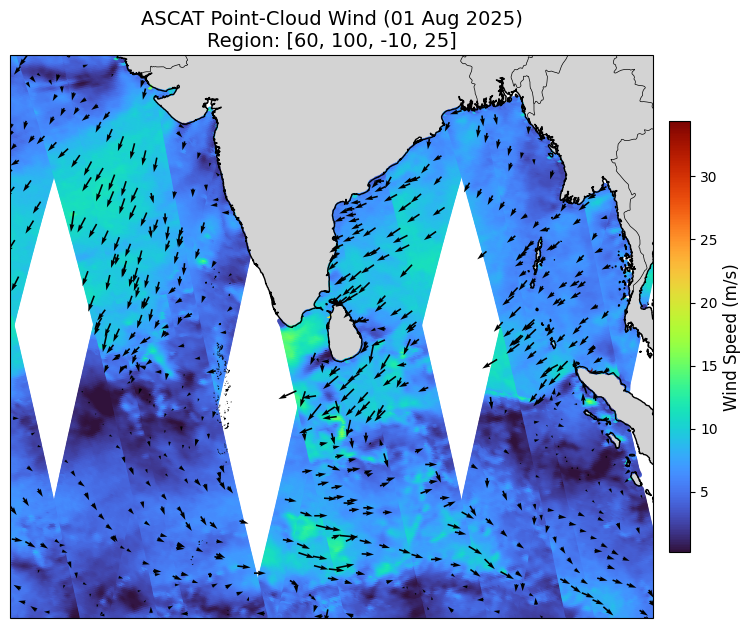

In [20]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ============================
# File path
# ============================
file_path = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250115\daily_region_output\ascat_points_20250115.nc"

# ============================
# Open dataset
# ============================
ds = xr.open_dataset(file_path)

# Extract variables
u = ds["u_obs"].values
v = ds["v_obs"].values
lat = ds["lat"].values
lon = ds["lon"].values
ws = ds["wind_speed"].values  # already stored

# ============================
# Define region of interest (ROI)
# ============================
# Full domain: [20, 120, -40, 30]
# You can adjust this ROI interactively:
ROI = [60, 100, -10, 25]   # [lon_min, lon_max, lat_min, lat_max]

# Apply ROI mask
mask = (
    (lon >= ROI[0]) & (lon <= ROI[1]) &
    (lat >= ROI[2]) & (lat <= ROI[3])
)
lon = lon[mask]
lat = lat[mask]
u   = u[mask]
v   = v[mask]
ws  = ws[mask]

# ============================
# Plotting
# ============================
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(10,8), subplot_kw={"projection": proj})

# Add coastlines and features
ax.coastlines(resolution="10m", color="black", linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor="lightgray")

# Set region from ROI
ax.set_extent(ROI, crs=proj)

# Wind speed shading (scatter, since data are points not grid)
sc = ax.scatter(lon, lat, c=ws, cmap="turbo", s=8, transform=proj)
cbar = plt.colorbar(sc, ax=ax, orientation="vertical", shrink=0.7, pad=0.02)
cbar.set_label("Wind Speed (m/s)", fontsize=12)

# Wind vectors (quiver on points, skip to reduce density)
skip = 200  # reduce clutter inside ROI
ax.quiver(lon[::skip], lat[::skip], u[::skip], v[::skip],
          transform=proj, scale=400, width=0.0025, color="k")

# Axis labels
ax.set_xlabel("Longitude (°E)", fontsize=12)
ax.set_ylabel("Latitude (°N)", fontsize=12)

# Title
ax.set_title(f"ASCAT Point-Cloud Wind (01 Aug 2025)\nRegion: {ROI}", fontsize=14)

plt.show()


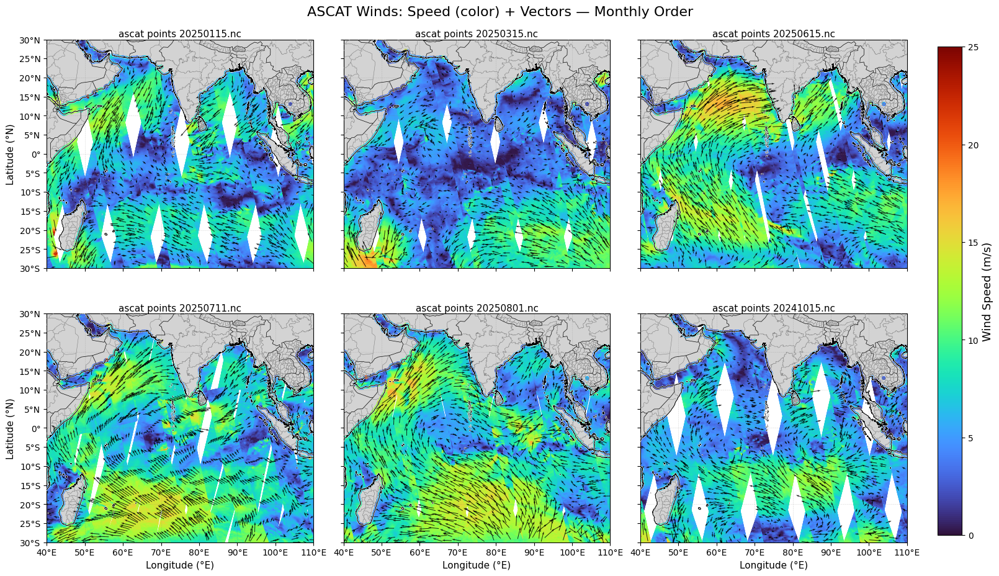

In [21]:
import os, re, glob
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# ============================
# Folder with .nc files
# ============================
folder = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"

# ============================
# Collect & sort files by month/day/year
# ============================
def sort_key(fname):
    m = re.search(r'(\d{8})', os.path.basename(fname))
    if m:
        ymd = m.group(1)
        return (int(ymd[4:6]), int(ymd[6:8]), int(ymd[0:4]))
    return (99,99,9999)

nc_files = sorted(glob.glob(os.path.join(folder, "*.nc")), key=sort_key)

# ============================
# ROI and ticks
# ============================
# For Indian coastal ocean
#ROI = [60, 100, -10, 25]   # [lon_min, lon_max, lat_min, lat_max]

# For Indian ocean
ROI = [40, 110, -30, 30]

xticks = np.arange(ROI[0], ROI[1] + 0.1, 10)
yticks = np.arange(ROI[2], ROI[3] + 0.1, 5)

# ============================
# Option: set fixed colorbar range
# ============================
USER_VMIN, USER_VMAX = 0, 25   # set None for auto scaling

# ============================
# Helper
# ============================
def read_masked(fp, ROI):
    ds = xr.open_dataset(fp)
    u, v = ds["u_obs"].values, ds["v_obs"].values
    ws = ds["wind_speed"].values
    lon, lat = ds["lon"].values, ds["lat"].values
    mask = ((lon >= ROI[0]) & (lon <= ROI[1]) &
            (lat >= ROI[2]) & (lat <= ROI[3]))
    return lon[mask], lat[mask], u[mask], v[mask], ws[mask]

# ============================
# Loop in groups of 6 (2x3 subplots)
# ============================
ncols, nrows = 3, 2
per_fig = ncols * nrows

for start in range(0, len(nc_files), per_fig):
    subset = nc_files[start:start+per_fig]

    # Pre-compute color scale if user did not fix it
    wmins, wmaxs, cached = [], [], []
    for fp in subset:
        lon, lat, u, v, ws = read_masked(fp, ROI)
        cached.append((fp, lon, lat, u, v, ws))
        if ws.size:
            wmins.append(np.nanmin(ws))
            wmaxs.append(np.nanmax(ws))
    vmin = USER_VMIN if USER_VMIN is not None else (min(wmins) if wmins else None)
    vmax = USER_VMAX if USER_VMAX is not None else (max(wmaxs) if wmaxs else None)

    # Figure with shared colorbar
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 9),
                             subplot_kw={"projection": ccrs.PlateCarree()},
                             constrained_layout=True)
    axes = axes.flatten()

    last_sc = None
    for j, (ax, item) in enumerate(zip(axes, cached)):
        fp, lon, lat, u, v, ws = item

        ax.set_extent(ROI, crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=0)

        # --- COASTAL BOUNDARY (crisp) ---
        # subtle white halo beneath a sharp black coastline so it stands out
        coast_white = cfeature.NaturalEarthFeature(
            'physical', 'coastline', '10m', edgecolor='white',
            facecolor='none', linewidth=1.6)
        coast_black = cfeature.NaturalEarthFeature(
            'physical', 'coastline', '10m', edgecolor='black',
            facecolor='none', linewidth=0.8)
        ax.add_feature(coast_white, zorder=4)   # halo
        ax.add_feature(coast_black, zorder=5)   # crisp coast on top

        # Country borders + state/province lines
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, zorder=3)
        ax.add_feature(cfeature.NaturalEarthFeature(
            'cultural', 'admin_1_states_provinces_lines', '10m',
            edgecolor='gray', facecolor='none', linewidth=0.4, zorder=3))

        # Wind speed scatter (background shading)
        if ws.size:
            last_sc = ax.scatter(lon, lat, c=ws, cmap="turbo", s=10,
                                 vmin=vmin, vmax=vmax,
                                 transform=ccrs.PlateCarree(), zorder=2)

        # Wind vectors (overlay on scatter)
        if u.size and v.size:
            skip = max(1, len(lon)//1200)  # balance density
            ax.quiver(lon[::skip], lat[::skip],
                      u[::skip], v[::skip],
                      transform=ccrs.PlateCarree(),
                      scale=300, width=0.0022,
                      color="k", alpha=0.85, zorder=3)

        # Grid + ticks
        ax.set_xticks(xticks, crs=ccrs.PlateCarree())
        ax.set_yticks(yticks, crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
        ax.yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
        ax.gridlines(draw_labels=False, linewidth=0.4, linestyle=":", color="0.5", alpha=0.6)

        # Only outer labels to avoid clutter (no bottom-left labels on inner plots)
        if j // ncols == nrows-1:
            ax.set_xlabel("Longitude (°E)", fontsize=11)
        else:
            ax.set_xlabel("")
            ax.tick_params(labelbottom=False)
        if j % ncols == 0:
            ax.set_ylabel("Latitude (°N)", fontsize=11)
        else:
            ax.set_ylabel("")
            ax.tick_params(labelleft=False)

        # Title
        ax.set_title(os.path.basename(fp).replace('_', ' '), fontsize=11, pad=3)

    # Remove unused axes if fewer than 6 files
    for k in range(len(subset), per_fig):
        fig.delaxes(axes[k])

    # Shared colorbar
    if last_sc is not None:
        cbar = fig.colorbar(last_sc, ax=axes, orientation="vertical", shrink=0.9, pad=0.02)
        cbar.set_label("Wind Speed (m/s)", fontsize=13)

    fig.suptitle("ASCAT Winds: Speed (color) + Vectors — Monthly Order", fontsize=16, y=1.02)
    plt.show()


# Wind Stress, Wind Stress Curl, Ekman Transport and Ekman Pumping

Saved derived fields to: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_stress_ekman_20250801.nc


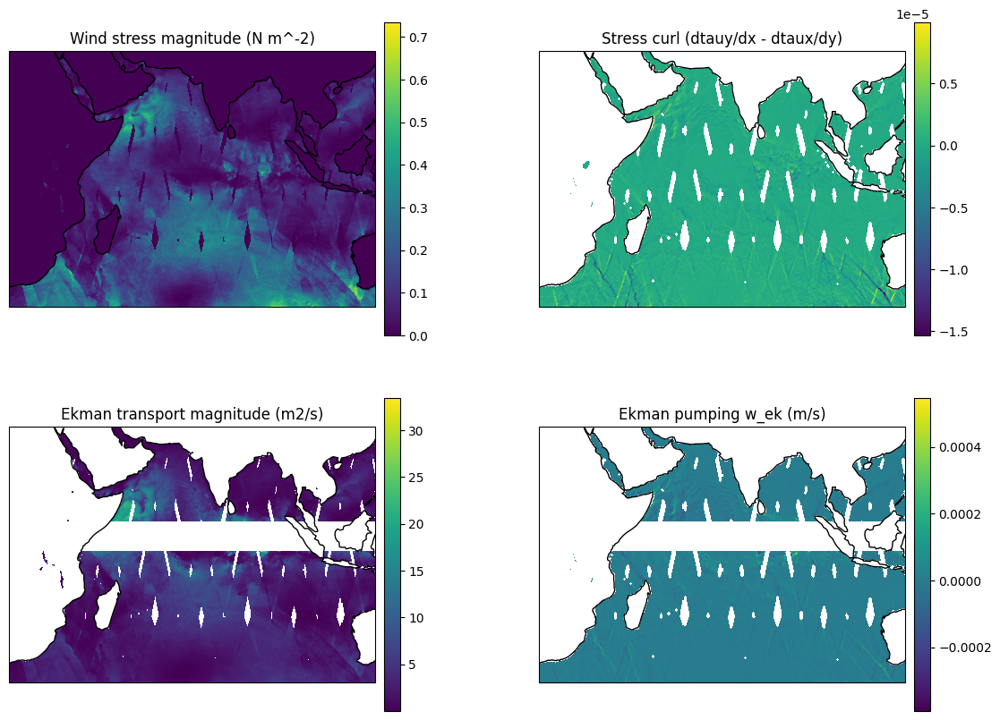

In [5]:
"""
Compute wind stress, stress curl and Ekman transport from ASCAT point-cloud.

Inputs:
 - point-cloud NetCDF with variables: lon, lat, u_obs, v_obs, wind_speed

Outputs:
 - gridded NetCDF with: u_binned, v_binned, wspd_binned, Cd, tau_x, tau_y, curl_tau, f, Mx, My, M_mag, w_ek
 - optional quick plots at the end

Formulas / choices (documented in code):
 - Drag coefficient Cd: Large and Pond (1981) piecewise:
     Cd*1e3 = 0.49 + 0.065 U   for U <= 11 m/s
     Cd*1e3 = 1.12 + 0.018 U   for 11 < U <= 25 m/s
     Cd*1e3 = 2.39             for U > 25 m/s  (cap)
   Cd used in stress τ = ρ_a * Cd * U * |U|  (vector form via components)
 - Air density rho_a default 1.225 kg/m3 (user-adjustable)
 - Seawater density rho_w = 1025 kg/m3
 - Coriolis f = 2 Ω sin(lat) with Ω = 7.292115e-5 s^-1
 - Ekman transport per unit length M = k × τ / (ρ_w f)  -> components:
       Mx = - τ_y / (ρ_w f)
       My =   τ_x / (ρ_w f)
 - Ekman pumping (vertical velocity) w_ek = (1/(ρ_w f)) * (∂τ_y/∂x - ∂τ_x/∂y)

Requires: numpy, xarray, scipy, matplotlib (optional)
"""
import os
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic_2d
import matplotlib.pyplot as plt

# ---------------- USER PARAMETERS ----------------
POINT_FILE = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_points_20250801.nc"
OUT_DIR = os.path.dirname(POINT_FILE)
OUT_GRID = os.path.join(OUT_DIR, "ascat_stress_ekman_20250801.nc")

# region + grid (choose how fine the L3 should be)
LON_MIN, LON_MAX = 20.0, 120.0
LAT_MIN, LAT_MAX = -40.0, 30.0
RES_DEG = 0.25   # grid resolution (deg) — choose 0.25 as standard compromise

# physical constants
rho_a = 1.225         # air density (kg m^-3)
rho_w = 1025.0        # seawater density (kg m^-3) for Ekman calculations
omega = 7.292115e-5   # earth rotation rate (s^-1)
R_earth = 6371000.0   # m

# masking threshold for coriolis near-equator
F_THRESHOLD = 1e-5    # s^-1 -> mask where |f| < threshold

# ---------------- LOAD POINT-CLOUD ----------------
ds = xr.open_dataset(POINT_FILE)
lon_pts = ds["lon"].values
lat_pts = ds["lat"].values
u_pts = ds["u_obs"].values
v_pts = ds["v_obs"].values
spd_pts = ds["wind_speed"].values

# ---------------- BIN (binned mean) TO REGULAR GRID ----------------
# Bin edges
lon_edges = np.arange(LON_MIN, LON_MAX + RES_DEG, RES_DEG)
lat_edges = np.arange(LAT_MIN, LAT_MAX + RES_DEG, RES_DEG)

# binned_statistic_2d expects x=lon, y=lat
# returns array shape (nx_bins, ny_bins) -> we'll transpose to (ny, nx)
stat_u, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, u_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_v, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, v_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_s, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, spd_pts, statistic='mean', bins=[lon_edges, lat_edges])

# transpose so arrays are (lat, lon)
u_grid = np.transpose(stat_u)
v_grid = np.transpose(stat_v)
spd_grid = np.transpose(stat_s)

# construct center coordinate arrays
lon_centers = 0.5 * (lon_edges[:-1] + lon_edges[1:])
lat_centers = 0.5 * (lat_edges[:-1] + lat_edges[1:])
Lon2d, Lat2d = np.meshgrid(lon_centers, lat_centers)

# ---------------- DRAG COEFFICIENT (Large and Pond 1981) ----------------
# Use U10 magnitude from binned speed (already in m/s)
U = np.where(np.isfinite(spd_grid), spd_grid, 0.0)

Cd = np.full_like(U, np.nan)

# piecewise formula (Cd in decimal, not x1e-3)
# Cd*1e3 = 0.49 + 0.065 U    (U <= 11)
# Cd*1e3 = 1.12 + 0.018 U    (11 < U <= 25)
# Cd*1e3 = 2.39              (U > 25)  <-- cap for extreme winds
mask1 = (U <= 11.0) & np.isfinite(U)
mask2 = (U > 11.0) & (U <= 25.0)
mask3 = (U > 25.0)

Cd[mask1] = (0.49 + 0.065 * U[mask1]) * 1e-3
Cd[mask2] = (1.12 + 0.018 * U[mask2]) * 1e-3
Cd[mask3] = 2.39e-3

# For grid cells with no data keep Cd as NaN
Cd[~np.isfinite(U)] = np.nan

# ---------------- WIND STRESS (vector) ----------------
# τ = ρ_a * Cd * U * |U|, component-wise: τx = ρ_a * Cd * u * |U|
# where u is eastward component and U = |wind vector|
tau_x = rho_a * Cd * u_grid * np.abs(U)
tau_y = rho_a * Cd * v_grid * np.abs(U)

# mask where no data
tau_x[~np.isfinite(U)] = np.nan
tau_y[~np.isfinite(U)] = np.nan

# ---------------- CORIOLIS PARAMETER f ----------------
lat_rad = np.deg2rad(Lat2d)
f = 2.0 * omega * np.sin(lat_rad)   # s^-1

# ---------------- SPATIAL DERIVATIVES (meters) ----------------
# compute grid spacing in meters for lon/lat
# dx varies with latitude: dx = R * cos(lat) * dlon(rad)
dlat = RES_DEG
dlon = RES_DEG
# convert degrees to radians factor
deg2rad = np.pi / 180.0

# dx at each latitude (per grid cell)
dx = (R_earth * np.cos(lat_rad)) * (dlon * deg2rad)   # shape (lat, lon) via broadcasting
# dy constant
dy = R_earth * (dlat * deg2rad)                       # scalar (m)

# compute derivatives: ∂τ_y/∂x and ∂τ_x/∂y
# use numpy.gradient which returns derivatives along axis 0 (lat) and 1 (lon)
# but careful: tau arrays indexed [ilat, ilon] where axis0 = lat, axis1 = lon
# ∂/∂x (along lon axis) -> axis=1 ; divide by dx (which varies with lat)
dtauy_dlon = np.gradient(tau_y, axis=1)  # derivative w.r.t grid index; divide by dx
dtaux_dlat = np.gradient(tau_x, axis=0)  # derivative w.r.t grid index; divide by dy

# convert index-derivatives to physical derivatives
# gradient above uses spacing = 1 index step; we must divide by physical spacing
# For ∂τ_y/∂x (x along lon), divide by dx (m) for each column; dx has shape (lat, lon)
dtauy_dx = dtauy_dlon / dx
# For ∂τ_x/∂y (y along lat), divide by dy (scalar)
dtaux_dy = dtaux_dlat / dy

# stress curl (scalar) = ∂τ_y/∂x − ∂τ_x/∂y
curl_tau = dtauy_dx - dtaux_dy

# mask where tau is NaN
curl_tau[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

# ---------------- EKMAN TRANSPORT ----------------
# Mx = - τ_y / (rho_w * f)
# My =   τ_x / (rho_w * f)
# handle small f -> mask
safe_f = f.copy()
safe_f[np.abs(safe_f) < F_THRESHOLD] = np.nan

Mx = - tau_y / (rho_w * safe_f)
My =   tau_x / (rho_w * safe_f)
M_mag = np.sqrt(np.nan_to_num(Mx)**2 + np.nan_to_num(My)**2)
Mx[~np.isfinite(tau_x) | ~np.isfinite(tau_y)] = np.nan
My[~np.isfinite(tau_x) | ~np.isfinite(tau_y)] = np.nan
M_mag[~np.isfinite(Mx) | ~np.isfinite(My)] = np.nan

# ---------------- EKMAN PUMPING VELOCITY ----------------
# w_ek = (1/(rho_w * f)) * curl_tau
w_ek = curl_tau / (rho_w * safe_f)
w_ek[~np.isfinite(curl_tau)] = np.nan

# ---------------- SAVE TO NETCDF ----------------
ds_out = xr.Dataset(
    data_vars = {
        "u_binned": (("lat", "lon"), u_grid, {"units":"m s-1", "long_name":"eastward_wind_binned"}),
        "v_binned": (("lat", "lon"), v_grid, {"units":"m s-1", "long_name":"northward_wind_binned"}),
        "wspd_binned": (("lat", "lon"), spd_grid, {"units":"m s-1", "long_name":"wind_speed_binned"}),
        "Cd": (("lat","lon"), Cd, {"units":"1", "long_name":"drag_coefficient"}),
        "tau_x": (("lat","lon"), tau_x, {"units":"N m-2", "long_name":"eastward_wind_stress"}),
        "tau_y": (("lat","lon"), tau_y, {"units":"N m-2", "long_name":"northward_wind_stress"}),
        "curl_tau": (("lat","lon"), curl_tau, {"units":"N m-3", "long_name":"stress_curl (dtauy/dx - dtaux/dy)"}),
        "f": (("lat","lon"), f, {"units":"s-1", "long_name":"coriolis_parameter"}),
        "Mx": (("lat","lon"), Mx, {"units":"m2 s-1", "long_name":"ekman_transport_eastward"}),
        "My": (("lat","lon"), My, {"units":"m2 s-1", "long_name":"ekman_transport_northward"}),
        "M_mag": (("lat","lon"), M_mag, {"units":"m2 s-1", "long_name":"ekman_transport_magnitude"}),
        "w_ek": (("lat","lon"), w_ek, {"units":"m s-1", "long_name":"ekman_pumping_velocity"}),
    },
    coords = {
        "lon": (("lon",), lon_centers, {"units":"degrees_east"}),
        "lat": (("lat",), lat_centers, {"units":"degrees_north"}),
    },
    attrs = {
        "source_pointcloud": POINT_FILE,
        "description": "Binned ASCAT winds and derived wind stress, curl and Ekman transport (binned L3)",
        "grid_resolution_deg": RES_DEG,
        "rho_air": rho_a,
        "rho_water": rho_w,
        "drag_formula": "Large and Pond (1981) piecewise",
        "notes": "Cells with insufficient data remain NaN. f masked near equator where |f| < threshold."
    }
)

ds_out.to_netcdf(OUT_GRID)
print("Saved derived fields to:", OUT_GRID)

# ---------------- OPTIONAL QUICK PLOTS ----------------
try:
    import matplotlib.pyplot as plt
    proj = ccrs.PlateCarree()
    fig, axs = plt.subplots(2,2, figsize=(14,10), subplot_kw={"projection":proj})
    axs = axs.ravel()
    # tau magnitude
    tau_mag = np.sqrt(np.nan_to_num(tau_x)**2 + np.nan_to_num(tau_y)**2)
    pcm0 = axs[0].pcolormesh(Lon2d, Lat2d, tau_mag, shading="auto")
    axs[0].coastlines(); axs[0].set_title("Wind stress magnitude (N m^-2)")
    plt.colorbar(pcm0, ax=axs[0], orientation="vertical", pad=0.02)

    pcm1 = axs[1].pcolormesh(Lon2d, Lat2d, curl_tau, shading="auto")
    axs[1].coastlines(); axs[1].set_title("Stress curl (dtauy/dx - dtaux/dy)")
    plt.colorbar(pcm1, ax=axs[1], orientation="vertical", pad=0.02)

    pcm2 = axs[2].pcolormesh(Lon2d, Lat2d, M_mag, shading="auto")
    axs[2].coastlines(); axs[2].set_title("Ekman transport magnitude (m2/s)")
    plt.colorbar(pcm2, ax=axs[2], orientation="vertical", pad=0.02)

    pcm3 = axs[3].pcolormesh(Lon2d, Lat2d, w_ek, shading="auto")
    axs[3].coastlines(); axs[3].set_title("Ekman pumping w_ek (m/s)")
    plt.colorbar(pcm3, ax=axs[3], orientation="vertical", pad=0.02)

    for ax in axs:
        ax.add_feature(plt.cm)  # no-op to keep consistent layering
    plt.tight_layout()
    plt.show()
except Exception:
    pass


Saved derived fields to: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_stress_ekman_20250801.nc
Saved figure: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_stress_ekman_20250801.png


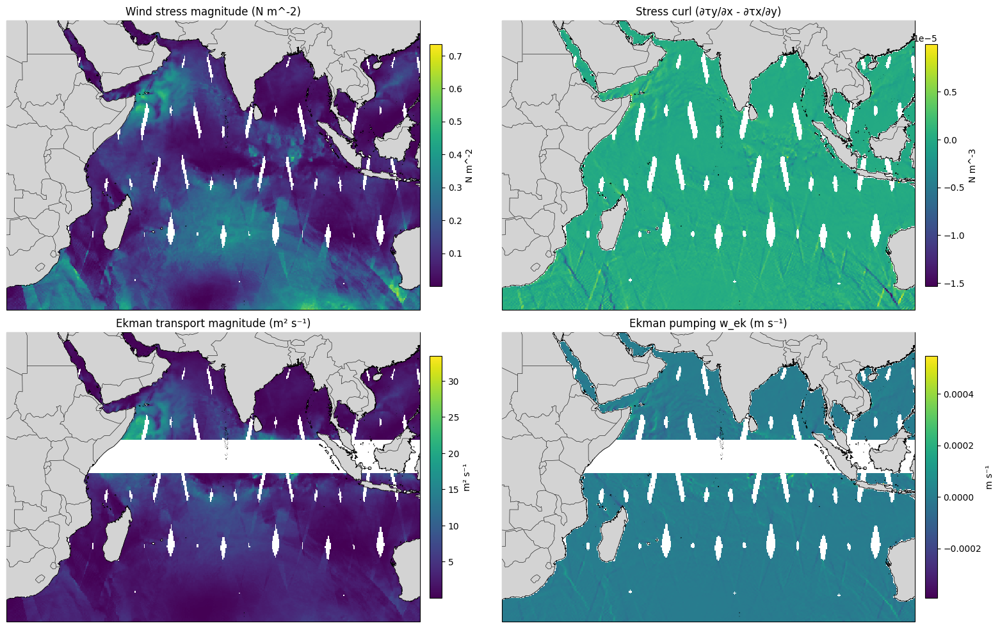

In [7]:
"""
Compute wind stress, stress curl and Ekman transport from ASCAT point-cloud
and plot results with land = gray and NaN = white (no-colormap effect on land).

Inputs:
 - point-cloud NetCDF with variables: lon, lat, u_obs, v_obs, wind_speed

Outputs:
 - gridded NetCDF with derived fields (same as before)
 - figure showing 4 panels where land is gray and missing data is white
"""
import os
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic_2d
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ---------------- USER PARAMETERS ----------------
POINT_FILE = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_points_20250801.nc"
OUT_DIR = os.path.dirname(POINT_FILE)
OUT_GRID = os.path.join(OUT_DIR, "ascat_stress_ekman_20250801.nc")
OUT_FIG = os.path.join(OUT_DIR, "ascat_stress_ekman_20250801.png")

# region + grid
LON_MIN, LON_MAX = 20.0, 120.0
LAT_MIN, LAT_MAX = -40.0, 30.0
RES_DEG = 0.25

# physical constants
rho_a = 1.225         # air density (kg m^-3)
rho_w = 1025.0        # seawater density (kg m^-3)
omega = 7.292115e-5   # earth rotation rate (s^-1)
R_earth = 6371000.0   # m

# mask near-equator
F_THRESHOLD = 1e-5

# ---------------- LOAD POINT-CLOUD ----------------
ds = xr.open_dataset(POINT_FILE)
lon_pts = ds["lon"].values
lat_pts = ds["lat"].values
u_pts = ds["u_obs"].values
v_pts = ds["v_obs"].values
spd_pts = ds["wind_speed"].values

# ---------------- BIN (binned mean) TO REGULAR GRID ----------------
lon_edges = np.arange(LON_MIN, LON_MAX + RES_DEG, RES_DEG)
lat_edges = np.arange(LAT_MIN, LAT_MAX + RES_DEG, RES_DEG)

stat_u, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, u_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_v, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, v_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_s, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, spd_pts, statistic='mean', bins=[lon_edges, lat_edges])

# transpose to (lat, lon)
u_grid = np.transpose(stat_u)
v_grid = np.transpose(stat_v)
spd_grid = np.transpose(stat_s)

# grid centers
lon_centers = 0.5 * (lon_edges[:-1] + lon_edges[1:])
lat_centers = 0.5 * (lat_edges[:-1] + lat_edges[1:])
Lon2d, Lat2d = np.meshgrid(lon_centers, lat_centers)

# ---------------- DRAG COEFFICIENT (Large and Pond 1981 piecewise) ----------------
U = spd_grid.copy()
Cd = np.full_like(U, np.nan)

mask1 = (U <= 11.0) & np.isfinite(U)
mask2 = (U > 11.0) & (U <= 25.0)
mask3 = (U > 25.0)

Cd[mask1] = (0.49 + 0.065 * U[mask1]) * 1e-3
Cd[mask2] = (1.12 + 0.018 * U[mask2]) * 1e-3
Cd[mask3] = 2.39e-3
Cd[~np.isfinite(U)] = np.nan

# ---------------- WIND STRESS ----------------
tau_x = rho_a * Cd * u_grid * np.abs(U)
tau_y = rho_a * Cd * v_grid * np.abs(U)
tau_x[~np.isfinite(U)] = np.nan
tau_y[~np.isfinite(U)] = np.nan
tau_mag = np.sqrt(np.nan_to_num(tau_x)**2 + np.nan_to_num(tau_y)**2)
tau_mag[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

# ---------------- CORIOLIS PARAMETER ----------------
lat_rad = np.deg2rad(Lat2d)
f = 2.0 * omega * np.sin(lat_rad)   # s^-1

# ---------------- SPATIAL DERIVATIVES ----------------
# spacing in meters
deg2rad = np.pi / 180.0
dlon_rad = RES_DEG * deg2rad
dlat_rad = RES_DEG * deg2rad

# dx is function of latitude (m); shape (ny, nx)
dx = R_earth * np.cos(lat_rad) * dlon_rad
dy = R_earth * dlat_rad  # scalar

# compute index-derivatives then divide by spacing in meters
# gradient along lon axis (axis=1) and lat axis (axis=0)
dtauy_idx = np.gradient(tau_y, axis=1)
dtaux_idx = np.gradient(tau_x, axis=0)

# convert to physical derivatives
# dtauy/dx (N m^-2 per m) -> axis=1 derivative divided by dx (elementwise)
dtauy_dx = np.empty_like(dtauy_idx)
dtauy_dx[:, :] = dtauy_idx[:, :] / dx[:, :]

# dtaux/dy (N m^-2 per m) -> divide by dy (scalar)
dtaux_dy = dtaux_idx / dy

curl_tau = dtauy_dx - dtaux_dy
curl_tau[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

# ---------------- EKMAN TRANSPORT & PUMPING ----------------
safe_f = f.copy()
safe_f[np.abs(safe_f) < F_THRESHOLD] = np.nan

# Mx = - tau_y / (rho_w * f)
# My =   tau_x / (rho_w * f)
Mx = - tau_y / (rho_w * safe_f)
My =   tau_x / (rho_w * safe_f)
Mx[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan
My[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan
M_mag = np.sqrt(np.nan_to_num(Mx)**2 + np.nan_to_num(My)**2)
M_mag[~(np.isfinite(Mx) & np.isfinite(My))] = np.nan

# Ekman pumping (vertical) w_ek = curl_tau / (rho_w * f)
w_ek = curl_tau / (rho_w * safe_f)
w_ek[~np.isfinite(curl_tau)] = np.nan

# ---------------- SAVE TO NETCDF ----------------
ds_out = xr.Dataset(
    data_vars = {
        "u_binned": (("lat", "lon"), u_grid, {"units":"m s-1", "long_name":"eastward_wind_binned"}),
        "v_binned": (("lat", "lon"), v_grid, {"units":"m s-1", "long_name":"northward_wind_binned"}),
        "wspd_binned": (("lat", "lon"), spd_grid, {"units":"m s-1", "long_name":"wind_speed_binned"}),
        "Cd": (("lat","lon"), Cd, {"units":"1", "long_name":"drag_coefficient"}),
        "tau_x": (("lat","lon"), tau_x, {"units":"N m-2", "long_name":"eastward_wind_stress"}),
        "tau_y": (("lat","lon"), tau_y, {"units":"N m-2", "long_name":"northward_wind_stress"}),
        "curl_tau": (("lat","lon"), curl_tau, {"units":"N m-3", "long_name":"stress_curl (dtauy/dx - dtaux/dy)"}),
        "f": (("lat","lon"), f, {"units":"s-1", "long_name":"coriolis_parameter"}),
        "Mx": (("lat","lon"), Mx, {"units":"m2 s-1", "long_name":"ekman_transport_eastward"}),
        "My": (("lat","lon"), My, {"units":"m2 s-1", "long_name":"ekman_transport_northward"}),
        "M_mag": (("lat","lon"), M_mag, {"units":"m2 s-1", "long_name":"ekman_transport_magnitude"}),
        "w_ek": (("lat","lon"), w_ek, {"units":"m s-1", "long_name":"ekman_pumping_velocity"}),
    },
    coords = {
        "lon": (("lon",), lon_centers, {"units":"degrees_east"}),
        "lat": (("lat",), lat_centers, {"units":"degrees_north"}),
    },
    attrs = {
        "source_pointcloud": POINT_FILE,
        "description": "Binned ASCAT winds and derived wind stress, curl and Ekman transport (binned L3)",
        "grid_resolution_deg": RES_DEG,
        "rho_air": rho_a,
        "rho_water": rho_w,
        "drag_formula": "Large and Pond (1981) piecewise",
        "notes": "Cells with insufficient data remain NaN. f masked near equator where |f| < threshold."
    }
)

ds_out.to_netcdf(OUT_GRID)
print("Saved derived fields to:", OUT_GRID)

# ---------------- PLOTTING: 4 panels ----------------
# helper to plot a 2D field with land gray and NaNs white
def plot_field(ax, Lon, Lat, data, cmap_name="viridis", title="", units_label=""):
    # mask invalid values
    data_masked = np.ma.masked_invalid(data)
    cmap = plt.get_cmap(cmap_name).copy()
    cmap.set_bad("white")   # NaN -> white
    # plot field
    pcm = ax.pcolormesh(Lon, Lat, data_masked, cmap=cmap, shading="auto", transform=ccrs.PlateCarree(), zorder=1)
    # overlay land in gray above the field so land is not colored by colormap
    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=5)
    # coastlines and borders on top
    ax.coastlines(resolution="10m", zorder=6, linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, zorder=6, linewidth=0.4)
    ax.set_title(title)
    cax = plt.gcf().colorbar(pcm, ax=ax, orientation="vertical", pad=0.02, shrink=0.8)
    cax.set_label(units_label)
    return pcm

proj = ccrs.PlateCarree()
fig, axs = plt.subplots(2, 2, figsize=(16,10), subplot_kw={"projection": proj})
axs = axs.ravel()

# set common extent
for ax in axs:
    ax.set_extent([LON_MIN, LON_MAX, LAT_MIN, LAT_MAX], crs=proj)

# panel 0: tau magnitude (N m^-2)
plot_field(axs[0], Lon2d, Lat2d, tau_mag, cmap_name="viridis", title="Wind stress magnitude (N m^-2)", units_label="N m^-2")

# panel 1: stress curl (N m^-3)
plot_field(axs[1], Lon2d, Lat2d, curl_tau, cmap_name="viridis", title="Stress curl (∂τy/∂x - ∂τx/∂y)", units_label="N m^-3")

# panel 2: Ekman transport magnitude (m^2 s^-1)
plot_field(axs[2], Lon2d, Lat2d, M_mag, cmap_name="viridis", title="Ekman transport magnitude (m² s⁻¹)", units_label="m² s⁻¹")

# panel 3: Ekman pumping w_ek (m s^-1)
plot_field(axs[3], Lon2d, Lat2d, w_ek, cmap_name="viridis", title="Ekman pumping w_ek (m s⁻¹)", units_label="m s⁻¹")

plt.tight_layout()
plt.savefig(OUT_FIG, dpi=250, bbox_inches="tight")
print("Saved figure:", OUT_FIG)
plt.show()


Saved derived fields to: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_stress_ekman_20250801.nc
Saved figure: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_stress_ekman_20250801.png


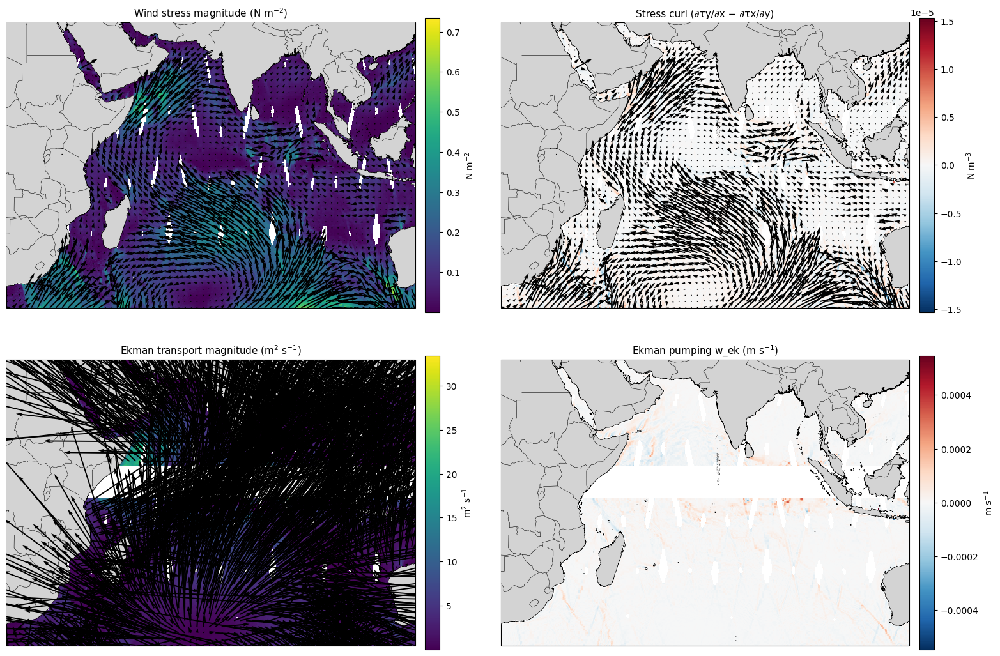

In [9]:
"""
ASCAT: compute wind stress, stress curl, Ekman transport and plot results.

Requirements:
    numpy, xarray, scipy, matplotlib, cartopy

Outputs:
    - Gridded NetCDF with derived fields
    - PNG figure with 4 panels (stress, curl, transport, pumping)
"""
import os
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic_2d
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ---------------- USER PARAMETERS ----------------
POINT_FILE = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_points_20250801.nc"
OUT_DIR = os.path.dirname(POINT_FILE)
OUT_GRID = os.path.join(OUT_DIR, "ascat_stress_ekman_20250801.nc")
OUT_FIG = os.path.join(OUT_DIR, "ascat_stress_ekman_20250801.png")

# domain and grid
LON_MIN, LON_MAX = 20.0, 120.0
LAT_MIN, LAT_MAX = -40.0, 30.0
RES_DEG = 0.25

# plotting decimation for vectors (higher -> fewer arrows)
VEC_SKIP = 6

# physics constants
rho_a = 1.225         # air density (kg m^-3)
rho_w = 1025.0        # seawater density (kg m^-3)
omega = 7.292115e-5   # earth rotation rate (s^-1)
R_earth = 6371000.0   # m
F_THRESHOLD = 1e-5    # mask for small f near equator

# ---------------- LOAD POINT-CLOUD ----------------
ds = xr.open_dataset(POINT_FILE)
lon_pts = ds["lon"].values
lat_pts = ds["lat"].values
u_pts = ds["u_obs"].values
v_pts = ds["v_obs"].values
spd_pts = ds["wind_speed"].values

# ---------------- BIN (binned mean) TO REGULAR GRID ----------------
lon_edges = np.arange(LON_MIN, LON_MAX + RES_DEG, RES_DEG)
lat_edges = np.arange(LAT_MIN, LAT_MAX + RES_DEG, RES_DEG)

stat_u, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, u_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_v, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, v_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_s, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, spd_pts, statistic='mean', bins=[lon_edges, lat_edges])

# transpose to (lat, lon)
u_grid = np.transpose(stat_u)
v_grid = np.transpose(stat_v)
spd_grid = np.transpose(stat_s)

# grid centers
lon_centers = 0.5 * (lon_edges[:-1] + lon_edges[1:])
lat_centers = 0.5 * (lat_edges[:-1] + lat_edges[1:])
Lon2d, Lat2d = np.meshgrid(lon_centers, lat_centers)

# ---------------- DRAG COEFFICIENT (Large & Pond 1981 piecewise) ----------------
U = spd_grid.copy()
Cd = np.full_like(U, np.nan)

mask1 = (U <= 11.0) & np.isfinite(U)
mask2 = (U > 11.0) & (U <= 25.0)
mask3 = (U > 25.0)

Cd[mask1] = (0.49 + 0.065 * U[mask1]) * 1e-3
Cd[mask2] = (1.12 + 0.018 * U[mask2]) * 1e-3
Cd[mask3] = 2.39e-3
Cd[~np.isfinite(U)] = np.nan

# ---------------- WIND STRESS ----------------
# tau_x = rho_a * Cd * u * |U|
# tau_y = rho_a * Cd * v * |U|
tau_x = rho_a * Cd * u_grid * np.abs(U)
tau_y = rho_a * Cd * v_grid * np.abs(U)
tau_x[~np.isfinite(U)] = np.nan
tau_y[~np.isfinite(U)] = np.nan
tau_mag = np.sqrt(np.nan_to_num(tau_x)**2 + np.nan_to_num(tau_y)**2)
tau_mag[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

# ---------------- CORIOLIS PARAMETER f ----------------
lat_rad = np.deg2rad(Lat2d)
f = 2.0 * omega * np.sin(lat_rad)   # s^-1

# ---------------- SPATIAL DERIVATIVES ----------------
deg2rad = np.pi / 180.0
dlon_rad = RES_DEG * deg2rad
dlat_rad = RES_DEG * deg2rad

dx = R_earth * np.cos(lat_rad) * dlon_rad   # m, shape (ny, nx)
dy = R_earth * dlat_rad                     # m, scalar

# compute index-derivatives then convert to physical derivatives
dtauy_idx = np.gradient(tau_y, axis=1)  # derivative w.r.t index along lon axis
dtaux_idx = np.gradient(tau_x, axis=0)  # derivative w.r.t index along lat axis

# dtauy/dx and dtaux/dy
dtauy_dx = np.empty_like(dtauy_idx)
dtauy_dx[:, :] = dtauy_idx[:, :] / dx[:, :]     # elementwise division
dtaux_dy = dtaux_idx / dy                        # divide by scalar

curl_tau = dtauy_dx - dtaux_dy
curl_tau[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

# ---------------- EKMAN TRANSPORT & PUMPING ----------------
safe_f = f.copy()
safe_f[np.abs(safe_f) < F_THRESHOLD] = np.nan

# Mx = - tau_y / (rho_w * f)
# My =   tau_x / (rho_w * f)
Mx = - tau_y / (rho_w * safe_f)
My =   tau_x / (rho_w * safe_f)
Mx[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan
My[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan
M_mag = np.sqrt(np.nan_to_num(Mx)**2 + np.nan_to_num(My)**2)
M_mag[~(np.isfinite(Mx) & np.isfinite(My))] = np.nan

# Ekman pumping (vertical) w_ek = curl_tau / (rho_w * f)
w_ek = curl_tau / (rho_w * safe_f)
w_ek[~np.isfinite(curl_tau)] = np.nan

# ---------------- SAVE TO NETCDF ----------------
ds_out = xr.Dataset(
    data_vars = {
        "u_binned": (("lat", "lon"), u_grid, {"units":"m s-1", "long_name":"eastward_wind_binned"}),
        "v_binned": (("lat", "lon"), v_grid, {"units":"m s-1", "long_name":"northward_wind_binned"}),
        "wspd_binned": (("lat", "lon"), spd_grid, {"units":"m s-1", "long_name":"wind_speed_binned"}),
        "Cd": (("lat","lon"), Cd, {"units":"1", "long_name":"drag_coefficient"}),
        "tau_x": (("lat","lon"), tau_x, {"units":"N m-2", "long_name":"eastward_wind_stress"}),
        "tau_y": (("lat","lon"), tau_y, {"units":"N m-2", "long_name":"northward_wind_stress"}),
        "curl_tau": (("lat","lon"), curl_tau, {"units":"N m-3", "long_name":"stress_curl (dtauy/dx - dtaux/dy)"}),
        "f": (("lat","lon"), f, {"units":"s-1", "long_name":"coriolis_parameter"}),
        "Mx": (("lat","lon"), Mx, {"units":"m2 s-1", "long_name":"ekman_transport_eastward"}),
        "My": (("lat","lon"), My, {"units":"m2 s-1", "long_name":"ekman_transport_northward"}),
        "M_mag": (("lat","lon"), M_mag, {"units":"m2 s-1", "long_name":"ekman_transport_magnitude"}),
        "w_ek": (("lat","lon"), w_ek, {"units":"m s-1", "long_name":"ekman_pumping_velocity"}),
    },
    coords = {
        "lon": (("lon",), lon_centers, {"units":"degrees_east"}),
        "lat": (("lat",), lat_centers, {"units":"degrees_north"}),
    },
    attrs = {
        "source_pointcloud": POINT_FILE,
        "description": "Binned ASCAT winds and derived wind stress, curl and Ekman transport (binned L3)",
        "grid_resolution_deg": RES_DEG,
        "rho_air": rho_a,
        "rho_water": rho_w,
        "drag_formula": "Large and Pond (1981) piecewise",
        "notes": "Cells with insufficient data remain NaN. f masked near equator where |f| < threshold."
    }
)

ds_out.to_netcdf(OUT_GRID)
print("Saved derived fields to:", OUT_GRID)

# ---------------- PLOTTING: 4 panels (land gray, NaN white, vectors, axis labels) ----------------
def plot_field_with_vectors(ax, Lon, Lat, field, title, units, vectors=None, skip=VEC_SKIP, cmap_name="viridis", symmetric=False):
    # mask invalid values
    data_masked = np.ma.masked_invalid(field)
    # make copy of colormap and set NaN color to white
    cmap = plt.get_cmap(cmap_name).copy()
    cmap.set_bad("white")
    # symmetric colorbar option
    if symmetric:
        vmax = np.nanmax(np.abs(field))
        vmin = -vmax
    else:
        vmin = np.nanmin(field)
        vmax = np.nanmax(field)
    # plot field
    pcm = ax.pcolormesh(Lon, Lat, data_masked, cmap=cmap, shading="auto", vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree(), zorder=1)
    # overlay land above field so land uses independent gray color
    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=5)
    ax.coastlines(resolution="10m", zorder=6, linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, zorder=6, linewidth=0.4)
    # vectors
    if vectors is not None:
        U, V = vectors
        # mask vectors where field is nan to avoid arrows over land/no-data
        mask_vec = np.isfinite(field)
        # decimate grid for arrows: select grid indices
        ax.quiver(Lon[::skip, ::skip], Lat[::skip, ::skip],
                  U[::skip, ::skip], V[::skip, ::skip],
                  transform=ccrs.PlateCarree(), scale=1, scale_units="inches", width=0.003, color="k", zorder=7)
    # axis labels and title
    ax.set_title(title, fontsize=11)
    ax.set_xlabel("Longitude (°E)")
    ax.set_ylabel("Latitude (°N)")
    # colorbar (tight to vmin/vmax)
    cb = plt.gcf().colorbar(pcm, ax=ax, orientation="vertical", pad=0.02, shrink=0.85)
    cb.set_label(units)
    return pcm

proj = ccrs.PlateCarree()
fig, axs = plt.subplots(2, 2, figsize=(16, 11), subplot_kw={"projection": proj})
axs = axs.ravel()

# set extent once for all axes
for ax in axs:
    ax.set_extent([LON_MIN, LON_MAX, LAT_MIN, LAT_MAX], crs=proj)

# Panel 1: wind stress magnitude + stress vectors
plot_field_with_vectors(
    axs[0], Lon2d, Lat2d, tau_mag,
    title="Wind stress magnitude (N m$^{-2}$)",
    units="N m$^{-2}$",
    vectors=(tau_x, tau_y),
    skip=VEC_SKIP,
    cmap_name="viridis",
    symmetric=False
)

# Panel 2: stress curl (symmetric) + stress vectors
plot_field_with_vectors(
    axs[1], Lon2d, Lat2d, curl_tau,
    title="Stress curl (∂τy/∂x − ∂τx/∂y)",
    units="N m$^{-3}$",
    vectors=(tau_x, tau_y),
    skip=VEC_SKIP,
    cmap_name="RdBu_r",
    symmetric=True
)

# Panel 3: Ekman transport magnitude + transport vectors
plot_field_with_vectors(
    axs[2], Lon2d, Lat2d, M_mag,
    title="Ekman transport magnitude (m$^2$ s$^{-1}$)",
    units="m$^2$ s$^{-1}$",
    vectors=(Mx, My),
    skip=VEC_SKIP,
    cmap_name="viridis",
    symmetric=False
)

# Panel 4: Ekman pumping (symmetric about zero)
plot_field_with_vectors(
    axs[3], Lon2d, Lat2d, w_ek,
    title="Ekman pumping w_ek (m s$^{-1}$)",
    units="m s$^{-1}$",
    vectors=None,
    skip=VEC_SKIP,
    cmap_name="RdBu_r",
    symmetric=True
)

plt.tight_layout()
plt.savefig(OUT_FIG, dpi=250, bbox_inches="tight")
print("Saved figure:", OUT_FIG)
plt.show()


Saved derived fields to: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_stress_ekman_20250801.nc
Saved figure: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_stress_ekman_20250801.png


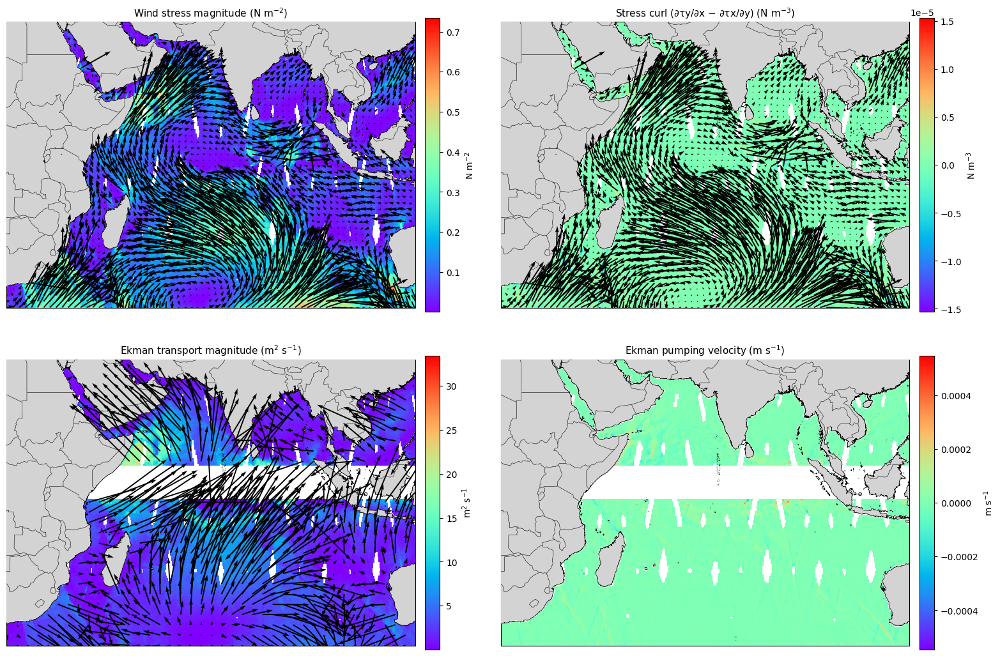

In [16]:
"""
ASCAT: compute wind stress, stress curl, Ekman transport and plot results.

Requirements:
    numpy, xarray, scipy, matplotlib, cartopy

Outputs:
    - Gridded NetCDF with derived fields
    - PNG figure with 4 panels (stress, curl, transport, pumping)
"""
import os
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic_2d
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ---------------- USER PARAMETERS ----------------
POINT_FILE = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\20250801\daily_region_output\ascat_points_20250801.nc"
OUT_DIR = os.path.dirname(POINT_FILE)
OUT_GRID = os.path.join(OUT_DIR, "ascat_stress_ekman_20250801.nc")
OUT_FIG = os.path.join(OUT_DIR, "ascat_stress_ekman_20250801.png")

# domain and grid
LON_MIN, LON_MAX = 20.0, 120.0
LAT_MIN, LAT_MAX = -40.0, 30.0
RES_DEG = 0.25

# ---------------- PHYSICAL CONSTANTS ----------------
rho_a = 1.225         # air density (kg m^-3)
rho_w = 1025.0        # seawater density (kg m^-3)
omega = 7.292115e-5   # earth rotation rate (s^-1)
R_earth = 6371000.0   # m
F_THRESHOLD = 1e-5    # mask for small f near equator

# ---------------- PLOTTING & VECTOR OPTIONS ----------------
# Each plot can have independent vector options, colorbar limits, and units
plot_options = {
    "tau_mag": {
        "vector_skip": 6,
        "vector_clip": None,
        "colorbar_min": None,
        "colorbar_max": None,
        "units": "N m$^{-2}$"
    },
    "curl_tau": {
        "vector_skip": 6,
        "vector_clip": None,
        "colorbar_min": None,
        "colorbar_max": None,
        "symmetric": True,
        "units": "N m$^{-3}$"
    },
    "M_mag": {
        "vector_skip": 10,
        "vector_clip": (-5, 5),
        "colorbar_min": None,
        "colorbar_max": None,
        "units": "m$^2$ s$^{-1}$"
    },
    "w_ek": {
        "vector_skip": 10,
        "vector_clip": None,
        "colorbar_min": None,
        "colorbar_max": None,
        "symmetric": True,
        "units": "m s$^{-1}$"
    }
}

# ---------------- LOAD POINT-CLOUD ----------------
ds = xr.open_dataset(POINT_FILE)
lon_pts = ds["lon"].values
lat_pts = ds["lat"].values
u_pts = ds["u_obs"].values
v_pts = ds["v_obs"].values
spd_pts = ds["wind_speed"].values

# ---------------- BIN TO REGULAR GRID ----------------
lon_edges = np.arange(LON_MIN, LON_MAX + RES_DEG, RES_DEG)
lat_edges = np.arange(LAT_MIN, LAT_MAX + RES_DEG, RES_DEG)

stat_u, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, u_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_v, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, v_pts, statistic='mean', bins=[lon_edges, lat_edges])
stat_s, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, spd_pts, statistic='mean', bins=[lon_edges, lat_edges])

# transpose to (lat, lon)
u_grid = np.transpose(stat_u)
v_grid = np.transpose(stat_v)
spd_grid = np.transpose(stat_s)

# grid centers
lon_centers = 0.5 * (lon_edges[:-1] + lon_edges[1:])
lat_centers = 0.5 * (lat_edges[:-1] + lat_edges[1:])
Lon2d, Lat2d = np.meshgrid(lon_centers, lat_centers)

# ---------------- DRAG COEFFICIENT ----------------
U = spd_grid.copy()
Cd = np.full_like(U, np.nan)

mask1 = (U <= 11.0) & np.isfinite(U)
mask2 = (U > 11.0) & (U <= 25.0)
mask3 = (U > 25.0)

Cd[mask1] = (0.49 + 0.065 * U[mask1]) * 1e-3
Cd[mask2] = (1.12 + 0.018 * U[mask2]) * 1e-3
Cd[mask3] = 2.39e-3
Cd[~np.isfinite(U)] = np.nan

# ---------------- WIND STRESS ----------------
tau_x = rho_a * Cd * u_grid * np.abs(U)
tau_y = rho_a * Cd * v_grid * np.abs(U)
tau_x[~np.isfinite(U)] = np.nan
tau_y[~np.isfinite(U)] = np.nan
tau_mag = np.sqrt(np.nan_to_num(tau_x)**2 + np.nan_to_num(tau_y)**2)
tau_mag[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

# ---------------- CORIOLIS PARAMETER ----------------
lat_rad = np.deg2rad(Lat2d)
f = 2.0 * omega * np.sin(lat_rad)

# ---------------- SPATIAL DERIVATIVES ----------------
deg2rad = np.pi / 180.0
dlon_rad = RES_DEG * deg2rad
dlat_rad = RES_DEG * deg2rad

dx = R_earth * np.cos(lat_rad) * dlon_rad
dy = R_earth * dlat_rad

dtauy_idx = np.gradient(tau_y, axis=1)
dtaux_idx = np.gradient(tau_x, axis=0)

dtauy_dx = dtauy_idx / dx
dtaux_dy = dtaux_idx / dy

curl_tau = dtauy_dx - dtaux_dy
curl_tau[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

# ---------------- EKMAN TRANSPORT & PUMPING ----------------
safe_f = f.copy()
safe_f[np.abs(safe_f) < F_THRESHOLD] = np.nan

Mx = - tau_y / (rho_w * safe_f)
My =   tau_x / (rho_w * safe_f)
Mx[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan
My[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan
M_mag = np.sqrt(np.nan_to_num(Mx)**2 + np.nan_to_num(My)**2)
M_mag[~(np.isfinite(Mx) & np.isfinite(My))] = np.nan

w_ek = curl_tau / (rho_w * safe_f)
w_ek[~np.isfinite(curl_tau)] = np.nan

# ---------------- SAVE TO NETCDF ----------------
ds_out = xr.Dataset(
    data_vars = {
        "u_binned": (("lat", "lon"), u_grid),
        "v_binned": (("lat", "lon"), v_grid),
        "wspd_binned": (("lat", "lon"), spd_grid),
        "Cd": (("lat","lon"), Cd),
        "tau_x": (("lat","lon"), tau_x),
        "tau_y": (("lat","lon"), tau_y),
        "curl_tau": (("lat","lon"), curl_tau),
        "f": (("lat","lon"), f),
        "Mx": (("lat","lon"), Mx),
        "My": (("lat","lon"), My),
        "M_mag": (("lat","lon"), M_mag),
        "w_ek": (("lat","lon"), w_ek),
    },
    coords = {
        "lon": (("lon",), lon_centers, {"units":"degrees_east"}),
        "lat": (("lat",), lat_centers, {"units":"degrees_north"}),
    },
    attrs = {
        "description": "ASCAT winds binned and derived wind stress, curl, and Ekman transport",
    }
)
ds_out.to_netcdf(OUT_GRID)
print("Saved derived fields to:", OUT_GRID)

# ---------------- PLOTTING FUNCTION ----------------
def plot_field_with_vectors(ax, Lon, Lat, field, title, units,
                            vectors=None, skip=6, clip_vectors=None,
                            vmin=None, vmax=None, symmetric=False):
    data_masked = np.ma.masked_invalid(field)
    cmap = plt.get_cmap("rainbow").copy()
    cmap.set_bad("white")

    if symmetric:
        vmax_plot = np.nanmax(np.abs(field)) if vmax is None else vmax
        vmin_plot = -vmax_plot if vmin is None else vmin
    else:
        vmin_plot = np.nanmin(field) if vmin is None else vmin
        vmax_plot = np.nanmax(field) if vmax is None else vmax

    pcm = ax.pcolormesh(Lon, Lat, data_masked, cmap=cmap, shading="auto",
                        vmin=vmin_plot, vmax=vmax_plot,
                        transform=ccrs.PlateCarree(), zorder=1)

    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=5)
    ax.coastlines(resolution="10m", zorder=6, linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, zorder=6, linewidth=0.4)

    if vectors is not None:
        U, V = vectors
        if clip_vectors is not None:
            U = np.clip(U, clip_vectors[0], clip_vectors[1])
            V = np.clip(V, clip_vectors[0], clip_vectors[1])
        ax.quiver(Lon[::skip, ::skip], Lat[::skip, ::skip],
                  U[::skip, ::skip], V[::skip, ::skip],
                  transform=ccrs.PlateCarree(),
                  scale=np.nanmax(np.sqrt(U**2 + V**2)) * 5,
                  width=0.003, color="k", zorder=7)

    ax.set_title(title, fontsize=11)
    ax.set_xlabel("Longitude (°E)")
    ax.set_ylabel("Latitude (°N)")
    cb = plt.gcf().colorbar(pcm, ax=ax, orientation="vertical", pad=0.02, shrink=0.85)
    cb.set_label(units)
    return pcm

# ---------------- PLOT ----------------
proj = ccrs.PlateCarree()
fig, axs = plt.subplots(2, 2, figsize=(16, 11), subplot_kw={"projection": proj})
axs = axs.ravel()

for ax in axs:
    ax.set_extent([LON_MIN, LON_MAX, LAT_MIN, LAT_MAX], crs=proj)

# Wind stress magnitude
plot_field_with_vectors(
    axs[0], Lon2d, Lat2d, tau_mag,
    title=f"Wind stress magnitude ({plot_options['tau_mag']['units']})",
    units=plot_options['tau_mag']['units'],
    vectors=(tau_x, tau_y),
    skip=plot_options["tau_mag"]["vector_skip"],
    clip_vectors=plot_options["tau_mag"]["vector_clip"],
    vmin=plot_options["tau_mag"]["colorbar_min"],
    vmax=plot_options["tau_mag"]["colorbar_max"]
)

# Stress curl
plot_field_with_vectors(
    axs[1], Lon2d, Lat2d, curl_tau,
    title=f"Stress curl (∂τy/∂x − ∂τx/∂y) ({plot_options['curl_tau']['units']})",
    units=plot_options['curl_tau']['units'],
    vectors=(tau_x, tau_y),
    skip=plot_options["curl_tau"]["vector_skip"],
    clip_vectors=plot_options["curl_tau"]["vector_clip"],
    vmin=plot_options["curl_tau"].get("colorbar_min"),
    vmax=plot_options["curl_tau"].get("colorbar_max"),
    symmetric=plot_options["curl_tau"].get("symmetric", False)
)

# Ekman transport magnitude
plot_field_with_vectors(
    axs[2], Lon2d, Lat2d, M_mag,
    title=f"Ekman transport magnitude ({plot_options['M_mag']['units']})",
    units=plot_options['M_mag']['units'],
    vectors=(Mx, My),
    skip=plot_options["M_mag"]["vector_skip"],
    clip_vectors=plot_options["M_mag"]["vector_clip"],
    vmin=plot_options["M_mag"]["colorbar_min"],
    vmax=plot_options["M_mag"]["colorbar_max"],
    symmetric=plot_options["M_mag"].get("symmetric", False)
)

# Ekman pumping
plot_field_with_vectors(
    axs[3], Lon2d, Lat2d, w_ek,
    title=f"Ekman pumping velocity ({plot_options['w_ek']['units']})",
    units=plot_options['w_ek']['units'],
    vectors=None,
    skip=plot_options["w_ek"]["vector_skip"],
    clip_vectors=plot_options["w_ek"]["vector_clip"],
    vmin=plot_options["w_ek"]["colorbar_min"],
    vmax=plot_options["w_ek"]["colorbar_max"],
    symmetric=plot_options["w_ek"].get("symmetric", False)
)

plt.tight_layout()
plt.savefig(OUT_FIG, dpi=250, bbox_inches="tight")
print("Saved figure:", OUT_FIG)
plt.show()
